# Preparation (SEMEN)

**This chapter is devoted to the preparation of tools for further analysis, including dependencies and additional functions**



### Dependencies import

In [ ]:
pip install hdbscan

In [ ]:
pip install pingouin

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
import itertools
from sklearn.metrics import calinski_harabasz_score
import hdbscan

from scipy.stats import shapiro, levene
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pingouin as pg

### Library (plots) declaration

Functions for drawing **box plots**

In [ ]:
def plot_box_plots(data):
    num_features = len(data.columns)
    plt.figure(figsize=(15, num_features * 3))

    for i, feature in enumerate(data.columns, 1):
        plt.subplot(num_features, 1, i)
        sns.boxplot(x=data[feature])
        plt.title(f'Box plot for {feature}')
        plt.gca().set_xlim(data[feature].min() - 1, data[feature].max() + 1)

    plt.tight_layout()
    plt.show()

Functions for **drawing density of the distribution**

In [ ]:
def plot_frequncy(data):
  plt.figure(figsize=(15, 15))
  for i, col in enumerate(data.columns):
      plt.subplot(3, 2, i + 1)
      sns.countplot(x=col, data=data)
      plt.title(f'Frequency of {col}')
      plt.xlabel(col)
      plt.ylabel('Count')
  plt.tight_layout()
  plt.show()

In [ ]:
def plot_features_density(data):
    num_cols = len(data.columns)
    num_rows = (num_cols + 1) // 2

    plt.figure(figsize=(15, num_rows * 5))

    for i, col in enumerate(data.columns):
        plt.subplot(num_rows, 2, i + 1)
        plt.hist(data[col], bins=50, range=(data[col].min(), data[col].quantile(0.95)))
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.title(f'Distribution of {col}')

    plt.tight_layout()
    plt.show()

:Function for **drawing 2D plots of dependency** between variables

In [ ]:
def plot_two_dimensional_graphs(features, labels = []):
    combinations = list(itertools.combinations(features.columns, 2))

    n_cols = 3
    n_rows = (len(combinations) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 8))

    unique_labels = sorted(set(labels))
    colors = plt.cm.viridis([i / len(unique_labels) for i in range(len(unique_labels))])

    for i, (feature_x, feature_y) in enumerate(combinations):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col]
        scatter = ax.scatter(features[feature_x], features[feature_y],c=labels if len(labels) == len( features[feature_y]) else None, cmap='viridis')
        ax.set_xlabel(feature_x)
        ax.set_ylabel(feature_y)
        ax.set_title(f'{feature_x} vs {feature_y}')

    for j in range(i + 1, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

    if len(labels) > 0:
      legend_handles = [
          plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=f'Cluster {label}')
          for label, color in zip(unique_labels, colors)
      ]
      fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=len(unique_labels), title="Clusters")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

Function for **drawing 3D plots of dependency** between variables

In [ ]:
def plot_three_dimensional_graphs(features, labels):
    combinations = list(itertools.combinations(features.columns, 3))

    n_cols = 3
    n_rows = (len(combinations) + n_cols - 1) // n_cols
    fig = plt.figure(figsize=(15, n_rows * 5))

    unique_labels = sorted(set(labels))
    colors = plt.cm.viridis([i / len(unique_labels) for i in range(len(unique_labels))])

    for i, (feature_x, feature_y, feature_z) in enumerate(combinations):
        ax = fig.add_subplot(n_rows, n_cols, i + 1, projection='3d')
        scatter = ax.scatter(features[feature_x], features[feature_y], features[feature_z], c=labels, cmap='viridis')

        ax.set_xlabel(feature_x)
        ax.set_ylabel(feature_y)
        ax.set_zlabel(feature_z)
        ax.set_title(f'{feature_x}\n{feature_y}\n{feature_z}', pad=20)

    legend_handles = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8, label=f'Cluster {label}')
        for label, color in zip(unique_labels, colors)
    ]
    fig.legend(handles=legend_handles, loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=len(unique_labels), title="Clusters")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

Function for drawing **heatmaps**

In [ ]:
def draw_heatmap(mapa, title, x_label, y_label):
    plt.figure(figsize=(10, 6))
    sns.heatmap(mapa, annot=True, cmap='coolwarm', center=0)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.show()

### Library (data preporation) declaration

Function that removes outliers from series by **quantatile method**

In [ ]:
def remove_outliers_by_quantile(data, features = []):
  for feature in features:
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    data = data[(data[feature] >= lower_bound) & (data[feature] <= upper_bound)]

  return data

### Library (clusering) declaration

**Elbow method**

In [ ]:
def elbow_method(features):
  inertia = []
  K = range(1, 10)
  for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features)
    inertia.append(kmeans.inertia_)

  plt.figure(figsize=(8, 6))
  plt.plot(K, inertia, 'bx-')
  plt.xlabel('Number of clusters (K)')
  plt.ylabel('Inertia')
  plt.title('Elbow Method for Optimal K')
  plt.show()

This function drawing a plot for defining **epsilon** for DBSCAN using **KNN**

In [ ]:
def eps_definition_knn(features, n_neighbors=2):
  nbrs = NearestNeighbors(n_neighbors=n_neighbors).fit(features)
  distances, indices = nbrs.kneighbors(features)

  distances_s = np.sort(distances[:, MIN_SAMPLES - 1])

  plt.plot(distances_s)
  plt.xlabel("Points sorted by distance to the k-th nearest neighbor")
  plt.ylabel(f"Distance to the {n_neighbors}-th nearest neighbor")
  plt.title("K-distance Graph")
  plt.grid()
  plt.show()

This function perform **KMeans** clustering algorithm

In [ ]:
def perform_kmeans_clustering(scaled_features, chosen_k):
    kmeans = KMeans(n_clusters=chosen_k, random_state=42)

    kmeans_labels = kmeans.fit_predict(scaled_features)

    plot_two_dimensional_graphs(scaled_features, kmeans_labels)
    plot_three_dimensional_graphs(scaled_features, kmeans_labels)


    return kmeans_labels

This function calculate **KMeans** metrics

In [ ]:
def calculate_kmeans_metrics(scaled_features, kmeans_labels):

    kmeans_silhouette = silhouette_score(scaled_features, kmeans_labels)
    kmeans_davies_bouldin = davies_bouldin_score(scaled_features, kmeans_labels)
    kmeans_calinski_harabasz = calinski_harabasz_score(scaled_features, kmeans_labels)

    print(f"Silhouette Score: {kmeans_silhouette}")
    print(f"Davies-Bouldin Index: {kmeans_davies_bouldin}")
    print(f"Calinski-Harabasz Index: {kmeans_calinski_harabasz}")

This function perform **DBSCAN** clustering algorithm

In [ ]:
def perform_dbscan_clustering(scaled_features, eps, min_samples):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)

    dbscan_labels = dbscan.fit_predict(scaled_features)
    print(np.unique(dbscan_labels))

    plot_two_dimensional_graphs(scaled_features, dbscan_labels)
    plot_three_dimensional_graphs(scaled_features, dbscan_labels)

    return dbscan_labels

This function perform **HDBSCAN** clustering algorithm

In [ ]:
def perform_hdbscan_clustering(scaled_features, min_samples):
    clusterer = hdbscan.HDBSCAN(min_cluster_size=MIN_SAMPLES, min_samples=MIN_SAMPLES)

    hdbscan_labels = clusterer.fit_predict(scaled_features)
    print(np.unique(hdbscan_labels))

    plot_two_dimensional_graphs(scaled_features, hdbscan_labels)
    plot_three_dimensional_graphs(scaled_features, hdbscan_labels)

    return hdbscan_labels

This function calculate **(H)DBSCAN** metrics

In [ ]:
def calculate_dbscan_metrics(scaled_features, dbscan_labels):
    core_samples = scaled_features[dbscan_labels != -1]
    core_labels = dbscan_labels[dbscan_labels != -1]

    dbscan_silhouette = silhouette_score(core_samples, core_labels)
    dbscan_davies_bouldin = davies_bouldin_score(core_samples, core_labels)
    dbscan_calinski_harabasz = calinski_harabasz_score(core_samples, core_labels)

    print(f"Silhouette Score: {dbscan_silhouette}")
    print(f"Davies-Bouldin Index: {dbscan_davies_bouldin}")
    print(f"Сalinski-Harabasz Index: {dbscan_calinski_harabasz}")

### Library (testing) declaration

In [ ]:
def equalize_row_counts(*datasets):
    min_rows = min(len(ds) for ds in datasets)

    equalized_datasets = []
    for ds in datasets:
        equalized_datasets.append(ds.sample(n=min_rows, random_state=42).reset_index(drop=True))

    return equalized_datasets


This function implements method for running statistical tests for comparison of mean

In [ ]:
def compare_groups(*datasets):
    features = datasets[0].columns
    results = {}

    for feature in features:
        # Normality check by Shapiro test
        normality_results = [shapiro(ds[feature])[1] > 0.05 for ds in datasets]
        norm_p_values = [shapiro(ds[feature])[1] for ds in datasets]

        print(f"\nFeature: {feature}")
        print("Normality test p-values:", norm_p_values)
        print("Normality per dataset:", normality_results)

        # Equal Variance test
        p_levene = levene(*[ds[feature] for ds in datasets])[1]
        equal_var = p_levene > 0.05

        print(f"Levene’s test for equal variances p-value: {p_levene:.4f}")
        print(f"Equal variances: {equal_var}")

        # Choosing paramet and non-parametr tests
        if all(normality_results) and equal_var:
            combined_data = pd.concat(datasets, axis=0)
            combined_data['group'] = sum([[f'group_{i+1}'] * len(ds) for i, ds in enumerate(datasets)], [])

            tukey = pairwise_tukeyhsd(endog=combined_data[feature], groups=combined_data['group'])
            results[feature] = tukey.summary()
            print("Selected test: Tukey’s HSD")
        else:
            combined_data = pd.concat(datasets, axis=0)
            combined_data['group'] = sum([[f'group_{i+1}'] * len(ds) for i, ds in enumerate(datasets)], [])

            games_howell = pg.pairwise_gameshowell(data=combined_data, dv=feature, between='group')
            results[feature] = games_howell
            print("Selected test: Games-Howell")

    return results

### Library (PCA) definition

In [ ]:
def calculate_explained_variance(pca):
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)

    plt.figure(figsize=(8, 5))
    plt.bar(range(1, 3), explained_variance * 100, tick_label=['PC1', 'PC2'])
    plt.ylabel('Explained variance (%)')
    plt.xlabel('Main components')
    plt.title('Explained variance')
    plt.show()

In [ ]:
def calculate_pca_dependencies(pca_df, labels, features, pca):
    pca_df['cluster'] = labels

    cluster_component_means = pca_df.groupby('cluster')[['PC1', 'PC2']].mean()
    draw_heatmap(cluster_component_means, 'Weights of main components in clusters', 'Main component', 'Clusters')

    loadings = pd.DataFrame(pca.components_.T, index=features.columns, columns=['PC1', 'PC2'])
    draw_heatmap(loadings, 'Weights of features in main component', 'Main components', 'Features')

    feature_cluster_influence = loadings.dot(cluster_component_means.T)
    feature_cluster_influence.index = features.columns

    draw_heatmap(feature_cluster_influence, 'Weights of features in clusters', 'Features', 'Clusters')

# EDA (SEMEN)

This chapter provides a basic analysis of the provided datasets. NaN checks are performed, dataset data types are studied, etc.

Reading of the dataset

In [ ]:
df_transactions = pd.read_parquet("TaoYin_User_Transactions_v2.parquet")
df_features = pd.read_parquet("Tao Yin_Item_features.parquet")

### Univariate statistics for transactions

In [ ]:
df_transactions

,customer,invoice,invoice_date,articlenr,volume,sum1,sum2,postcode_delivery,postcode_customer,channel
0,2284,1187467,2020-01-02,32879960,24,343.73,362.30,80413,80413,Tel 86041
1,2284,1187467,2020-01-02,32879962,60,1067.64,1119.96,80413,80413,Tel 86041
2,2284,1187467,2020-01-02,32841810,120,2214.00,2408.40,80413,80413,Tel 86041
3,1704,1191447,2020-01-17,36866802,1,21.52,19.32,81724,81724,OTC 81812
4,45,1187691,2020-01-03,34360272,4,28.91,28.49,81796,81796,Web Order
...,...,...,...,...,...,...,...,...,...,...
492726,441,1596745,2024-09-19,34100450,4,590.03,619.53,85684,85684,ERP Order
492727,2478,1596752,2024-09-19,37061626,2,23.86,18.94,85711,85711,Web Order
492728,2478,1596752,2024-09-19,32447128,10,27.82,23.54,85711,85711,Web Order
492729,2478,1596752,2024-09-19,32440824,10,4.88,4.13,85711,85711,Web Order


In [ ]:
df_transactions.describe()

,customer,invoice,invoice_date,articlenr,volume,sum1,sum2,postcode_delivery,postcode_customer
count,492731.000000,4.927310e+05,492731,4.927310e+05,4.927310e+05,4.927310e+05,4.927310e+05,492731.000000,492731.000000
mean,1105.068348,1.380729e+06,2022-02-16 19:03:53.967011840,3.340759e+07,7.970227e+01,2.324029e+02,2.594201e+02,84794.165662,84800.903523
min,0.000000,1.187460e+06,2020-01-02 00:00:00,2.128738e+07,0.000000e+00,0.000000e+00,0.000000e+00,80000.000000,80000.000000
25%,441.000000,1.279060e+06,2020-12-22 00:00:00,3.260855e+07,1.000000e+00,1.288000e+01,1.247000e+01,81749.000000,81749.000000
50%,812.000000,1.372680e+06,2022-01-18 00:00:00,3.428449e+07,4.000000e+00,3.804000e+01,3.708000e+01,85521.000000,85521.000000
75%,1877.000000,1.480206e+06,2023-03-28 00:00:00,3.520167e+07,2.400000e+01,1.104000e+02,1.104200e+02,86067.000000,86067.000000
max,2500.000000,2.962232e+06,2024-09-25 00:00:00,3.996037e+07,1.861772e+06,4.596244e+07,5.599838e+07,89900.000000,89979.000000
std,820.549903,1.178140e+05,NaN,2.750455e+06,2.689912e+03,6.601875e+04,8.032716e+04,2549.799176,2553.088038


In [ ]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 492731 entries, 0 to 492730
Data columns (total 10 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   customer           492731 non-null  int64         
 1   invoice            492731 non-null  int64         
 2   invoice_date       492731 non-null  datetime64[ns]
 3   articlenr          492731 non-null  int64         
 4   volume             492731 non-null  int64         
 5   sum1               492731 non-null  float64       
 6   sum2               492731 non-null  float64       
 7   postcode_delivery  492731 non-null  int64         
 8   postcode_customer  492731 non-null  int64         
 9   channel            492731 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(6), object(1)
memory usage: 37.6+ MB


As you can see, there is **no missing data** in the dataset

In [ ]:
missing_values = df_transactions.isnull().sum()
print("Missing Values:\n\n", missing_values)

Missing Values:

 customer             0
invoice              0
invoice_date         0
articlenr            0
volume               0
sum1                 0
sum2                 0
postcode_delivery    0
postcode_customer    0
channel              0
dtype: int64


The data can be considered **historical**, since the largest part of them is within the 2020-2022 period, which means that long-term conclusions can be drawn on their basis

<ipython-input-24-e8e57df8c082>:1: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  df_transactions.set_index('invoice_date').resample('Y').size().plot(title='Monthly Counts Over Time')


<Axes: title={'center': 'Monthly Counts Over Time'}, xlabel='invoice_date'>

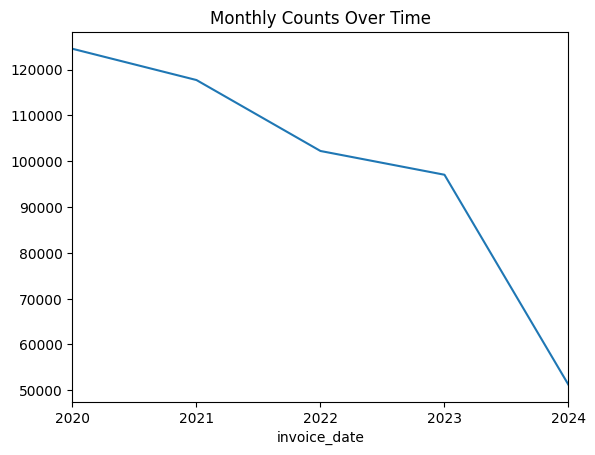

In [ ]:
df_transactions.set_index('invoice_date').resample('Y').size().plot(title='Monthly Counts Over Time')

The analysis starts by processing two datasets:
RetailRocket.parquet - Contains basic session information RetailRocket_LogData.parquet - Contains detailed event logs

In [ ]:
df_transactions_continious = ['volume', 'sum1', 'sum2']

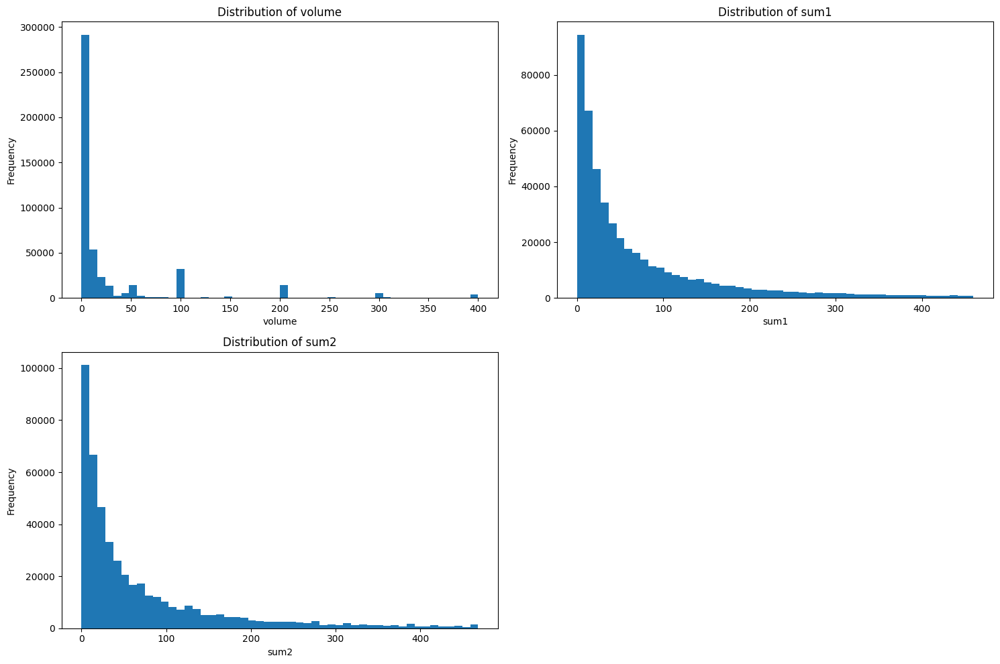

In [ ]:
plot_features_density(df_transactions[df_transactions_continious])

### Bivariate analysis for transactions

There is a logical strict correlation between the two prices. More interestingly, there is also a positive correlation between prices and volume, although according to the general sense, volume should fall with an increase in price. Perhaps **the company is experiencing a large growth of customers**, who support the increasing volume.

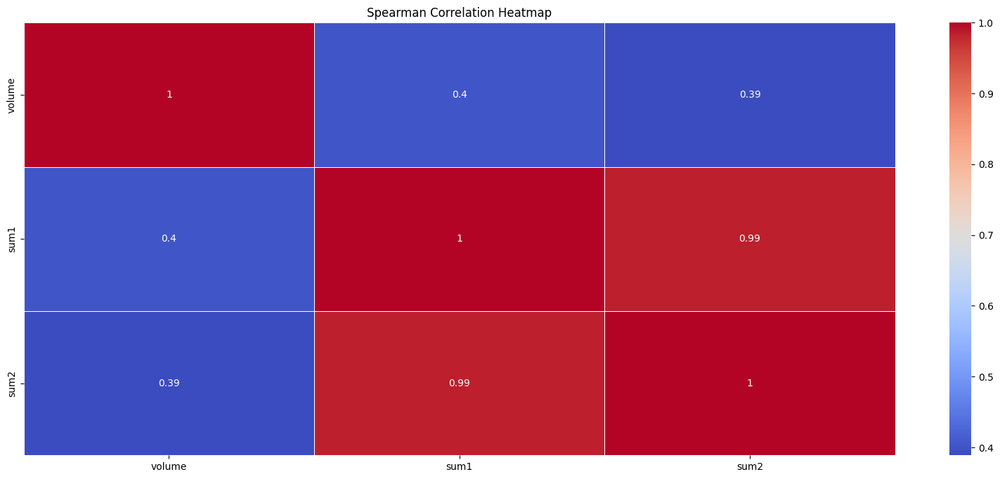

In [ ]:
plt.figure(figsize=(20, 8))
corr_matrix = df_transactions[df_transactions_continious].corr('spearman')
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.show()

## Univariate statistics for features



The second dataset is a description of the items that are being sold. The description consists of a voluminous number of unnamed features with a large number of **omissions**

In [ ]:
df_features

,Articlenr,EF000001,EF000002,EF000003,EF000004,EF000005,EF000006,EF000007,EF000008,EF000010,...,EFDE0031,EFDE0032,EFFR0001,EFFR0002,EFNL0014,EFUK0017,EFUK0019,ETIM,statistiek_hoofdgroep,statistiek_subgroep
0,34581962,6.0,NaN,NaN,NaN,NaN,NaN,NaN,6.2,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,A,x1
1,35764300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,A,x2
2,35823358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.0,A,x3
3,28405226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,321.0,B,y1
4,35622440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,C,y2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168934,36400064,NaN,NaN,7.0,NaN,NaN,NaN,48.0,930.0,251.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,437.0,E,v2
168935,35683154,NaN,NaN,NaN,NaN,NaN,NaN,NaN,210.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.0,A,u3
168936,34382454,NaN,NaN,203.0,NaN,361.0,NaN,48.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A,u1
168937,35544288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.0,C,y2


In [ ]:
missing_values = df_features.isnull().sum()
print("Missing Values:\n\n", missing_values)

Missing Values:

 Articlenr                     0
EF000001                 162600
EF000002                 164018
EF000003                 142308
EF000004                 158292
                          ...  
EFUK0017                 168922
EFUK0019                 168876
ETIM                        143
statistiek_hoofdgroep         0
statistiek_subgroep           0
Length: 4028, dtype: int64


In [ ]:
df_features[df_features.ETIM.isna()]

,Articlenr,EF000001,EF000002,EF000003,EF000004,EF000005,EF000006,EF000007,EF000008,EF000010,...,EFDE0031,EFDE0032,EFFR0001,EFFR0002,EFNL0014,EFUK0017,EFUK0019,ETIM,statistiek_hoofdgroep,statistiek_subgroep
1852,34382442,NaN,NaN,203.0,NaN,361.0,NaN,48.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A,u1
2621,32209912,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,H,s2
12821,34382564,NaN,NaN,203.0,NaN,NaN,NaN,48.0,NaN,217.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A,u1
13672,32209820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1911.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,H,s2
14282,34382486,NaN,NaN,NaN,NaN,NaN,NaN,48.0,69.5,98.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A,u1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160894,34205538,NaN,NaN,NaN,NaN,NaN,NaN,422.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,F,w1
162578,34420544,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,z3
164266,34382488,NaN,NaN,NaN,NaN,NaN,NaN,48.0,69.5,98.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A,u1
166414,32209906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,H,s2


In [ ]:
df_features[(df_features['statistiek_hoofdgroep'] == 'A') & (df_features['statistiek_subgroep'] == 'u1')]

,Articlenr,EF000001,EF000002,EF000003,EF000004,EF000005,EF000006,EF000007,EF000008,EF000010,...,EFDE0031,EFDE0032,EFFR0001,EFFR0002,EFNL0014,EFUK0017,EFUK0019,ETIM,statistiek_hoofdgroep,statistiek_subgroep
13,34300312,NaN,NaN,NaN,NaN,NaN,NaN,148.0,NaN,269.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,164.0,A,u1
33,34545674,16.0,250.0,203.0,NaN,NaN,NaN,1.0,NaN,254.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,276.0,A,u1
60,34548038,NaN,NaN,145.0,NaN,1.0,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,277.0,A,u1
75,34286584,15.0,125.0,203.0,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,276.0,A,u1
79,34545260,16.0,250.0,203.0,NaN,NaN,NaN,1.0,NaN,254.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,276.0,A,u1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168895,34546726,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,399.0,A,u1
168918,34383470,16.0,250.0,203.0,NaN,NaN,NaN,109.0,NaN,346.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,276.0,A,u1
168921,34564246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2267.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,627.0,A,u1
168927,34260454,NaN,NaN,NaN,NaN,NaN,NaN,109.0,NaN,177.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,164.0,A,u1


In turn, it can be noted that the majority of customers prefer products of specific categories. Of considerable interest is whether people who prefer a small number of categories are more profitable customers

In [ ]:
df_features_discrete = ['statistiek_hoofdgroep', 'statistiek_subgroep']

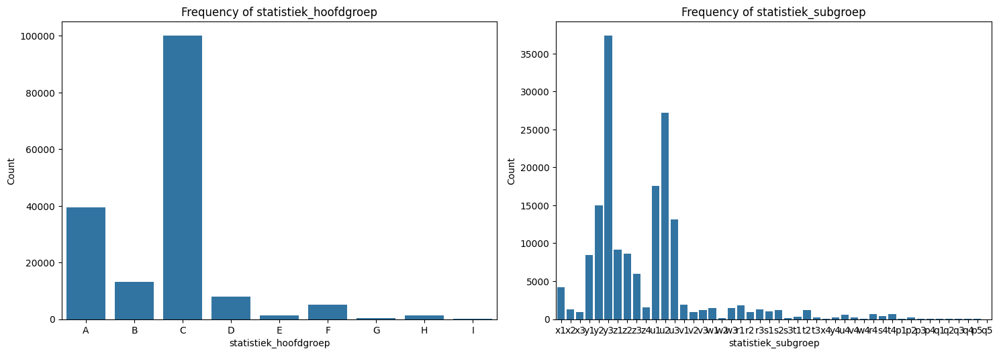

In [ ]:
plot_frequncy(df_features[df_features_discrete])

# Feature engineering (ALL)

In this chapter, features describing the user are generated. The intermediate and final result can be observed in the variable below

In [ ]:
user_features = pd.DataFrame()
user_features['customer'] = sorted(df_transactions['customer'].unique())
user_features = user_features.set_index('customer')
user_features

""
customer
0
3
4
5
6
...
2491
2492
2493


### Recency per user (SEMEN)

This feature describes **the time elapsed from the user's last purchase to the last date in the dataset**

**Business value**: with a large value, the client's feature can be considered lost, with a small one - remaining with us

In [ ]:
recency_features = df_transactions.groupby("customer").agg(
    last_purchase=("invoice_date", "max")
)
recency_features

,last_purchase
customer,
0,2020-10-06
3,2024-09-19
4,2024-05-03
5,2020-03-06
6,2021-07-02
...,...
2491,2024-09-12
2492,2024-05-22
2493,2021-10-14


In [ ]:
recency_features["recency"] = recency_features.last_purchase.apply(lambda x: (pd.Timestamp('2024-09-25 00:00:00') - x).days)
recency_features.drop(columns=["last_purchase"], inplace=True)
recency_features

,recency
customer,
0,1450
3,6
4,145
5,1664
6,1181
...,...
2491,13
2492,126
2493,1077


In [ ]:
user_features['recency'] = recency_features['recency']

user_features

,recency
customer,
0,1450
3,6
4,145
5,1664
6,1181
...,...
2491,13
2492,126
2493,1077


### Total amount of transcations per user (SEMEN)

This feature describes **the total number of transactions** made by the user

**Business value:** with a high value of the feature, the client can be perceived as a buyer of a large volume of products, with a small volume - a random buyer. The feature provides a lot of information in conjunction with others

In [ ]:
total_features = df_transactions.groupby("customer").agg(
    total_purchases=("invoice", "count"),
)
total_features

,total_purchases
customer,
0,1
3,2432
4,109
5,33
6,3
...,...
2491,22
2492,191
2493,8


In [ ]:
user_features['total_purchases'] = total_features['total_purchases']

user_features

,recency,total_purchases
customer,,
0,1450,1
3,6,2432
4,145,109
5,1664,33
6,1181,3
...,...,...
2491,13,22
2492,126,191
2493,1077,8


### Average profit of the user (ZAKARIA)

This feature describes** the average profit per transaction** from the buyer

**Business value:** the feature determines the profitability of the client for the company

In [ ]:
avg_profit_features = user_features.copy()

df_transactions['profit'] = (df_transactions['sum2'] - df_transactions['sum1']) * df_transactions['volume']

df_summary = df_transactions.groupby('customer').agg(
    total_profit=('profit', 'sum'),
    total_volume=('volume', 'sum')
)

avg_profit_features['avg_profit'] = df_summary['total_profit'] / df_summary['total_volume']

avg_profit_features

,recency,total_purchases,avg_profit
customer,,,
0,1450,1,-2.530000
3,6,2432,20.936678
4,145,109,-10.865057
5,1664,33,-119.764596
6,1181,3,-2.963333
...,...,...,...
2491,13,22,-22.578655
2492,126,191,-25.499640
2493,1077,8,16.471667


In [ ]:
user_features['avg_profit'] = avg_profit_features['avg_profit']
user_features

,recency,total_purchases,avg_profit
customer,,,
0,1450,1,-2.530000
3,6,2432,20.936678
4,145,109,-10.865057
5,1664,33,-119.764596
6,1181,3,-2.963333
...,...,...,...
2491,13,22,-22.578655
2492,126,191,-25.499640
2493,1077,8,16.471667


### Average volume per transaction of the user (ZAKARIA)

This feature describes **the average sales volume per transaction** from the buyer

**Business value**: in conjunction with other features, it allows you to estimate how large a volume of products a customer can buy and what profit it brings

In [ ]:
avg_volume_features = user_features.copy()

df_summary = df_transactions.groupby('customer').agg(
    total_volume=('volume', 'sum')
)

avg_volume_features['avg_volume_per_purchase'] = (df_summary['total_volume'] / avg_volume_features['total_purchases'])

avg_volume_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
0,1450,1,-2.530000,1.000000
3,6,2432,20.936678,120.608964
4,145,109,-10.865057,12.064220
5,1664,33,-119.764596,4.878788
6,1181,3,-2.963333,1.000000
...,...,...,...,...
2491,13,22,-22.578655,15.545455
2492,126,191,-25.499640,19.026178
2493,1077,8,16.471667,10.500000


In [ ]:
user_features['avg_volume_per_purchase'] = avg_volume_features['avg_volume_per_purchase']
user_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
0,1450,1,-2.530000,1.000000
3,6,2432,20.936678,120.608964
4,145,109,-10.865057,12.064220
5,1664,33,-119.764596,4.878788
6,1181,3,-2.963333,1.000000
...,...,...,...,...
2491,13,22,-22.578655,15.545455
2492,126,191,-25.499640,19.026178
2493,1077,8,16.471667,10.500000


### Count of the different postcodes (MEL)

This feature describes **the number of customer orders that have been sent to a different postal code**

**Business Value:** Represents a potential opportunity to track dropshippers

In [ ]:
count_different_postcode_features = user_features.copy()

df_transactions['different_postcode'] = df_transactions['postcode_delivery'] != df_transactions['postcode_customer']

different_postcodes = df_transactions[df_transactions['different_postcode']]

count_different_postcode_features = different_postcodes[['customer', 'invoice']].drop_duplicates().groupby('customer').size().reset_index(name='different_postcode_count').set_index('customer')
count_different_postcode_features

,different_postcode_count
customer,
17,2
34,155
41,2
42,71
48,12
...,...
2486,41
2488,530
2491,16


In [ ]:
user_features['different_postcode_count'] = count_different_postcode_features['different_postcode_count']
user_features['different_postcode_count'] = user_features['different_postcode_count'].fillna(0)
user_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count
customer,,,,,
0,1450,1,-2.530000,1.000000,0.0
3,6,2432,20.936678,120.608964,0.0
4,145,109,-10.865057,12.064220,0.0
5,1664,33,-119.764596,4.878788,0.0
6,1181,3,-2.963333,1.000000,0.0
...,...,...,...,...,...
2491,13,22,-22.578655,15.545455,16.0
2492,126,191,-25.499640,19.026178,0.0
2493,1077,8,16.471667,10.500000,4.0


### Category diversion of the user (MEL)

This feature describes **the number of product categories** that a customer has ever ordered

**Business value:** provides an opportunity to assess the impact of consumption of various goods on the company's profit

In [ ]:
merged_data = pd.merge(
    df_transactions[['customer', 'invoice', 'articlenr', 'volume', 'sum1', 'sum2', 'channel']],
    df_features[['Articlenr', 'statistiek_hoofdgroep', 'statistiek_subgroep']],
    left_on='articlenr',
    right_on='Articlenr',
    how='left'
).drop(columns=['Articlenr'])

merged_data

,customer,invoice,articlenr,volume,sum1,sum2,channel,statistiek_hoofdgroep,statistiek_subgroep
0,2284,1187467,32879960,24,343.73,362.30,Tel 86041,NaN,NaN
1,2284,1187467,32879962,60,1067.64,1119.96,Tel 86041,NaN,NaN
2,2284,1187467,32841810,120,2214.00,2408.40,Tel 86041,NaN,NaN
3,1704,1191447,36866802,1,21.52,19.32,OTC 81812,NaN,NaN
4,45,1187691,34360272,4,28.91,28.49,Web Order,NaN,NaN
...,...,...,...,...,...,...,...,...,...
495886,441,1596745,34100450,4,590.03,619.53,ERP Order,C,u2
495887,2478,1596752,37061626,2,23.86,18.94,Web Order,NaN,NaN
495888,2478,1596752,32447128,10,27.82,23.54,Web Order,NaN,NaN
495889,2478,1596752,32440824,10,4.88,4.13,Web Order,NaN,NaN


In [ ]:
category_diversity = merged_data.groupby('customer')['statistiek_hoofdgroep'].nunique().to_frame('category_diversity')

category_diversity

,category_diversity
customer,
0,1
3,5
4,3
5,1
6,1
...,...
2491,1
2492,4
2493,0


In [ ]:
user_features['category_diversity'] = category_diversity
user_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count,category_diversity
customer,,,,,,
0,1450,1,-2.530000,1.000000,0.0,1
3,6,2432,20.936678,120.608964,0.0,5
4,145,109,-10.865057,12.064220,0.0,3
5,1664,33,-119.764596,4.878788,0.0,1
6,1181,3,-2.963333,1.000000,0.0,1
...,...,...,...,...,...,...
2491,13,22,-22.578655,15.545455,16.0,1
2492,126,191,-25.499640,19.026178,0.0,4
2493,1077,8,16.471667,10.500000,4.0,0


# EDA of user features (SEMEN)

This chapter describes a new feature file about users

### Univariate statistics for users

In [ ]:
user_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count,category_diversity
customer,,,,,,
0,1450,1,-2.530000,1.000000,0.0,1
3,6,2432,20.936678,120.608964,0.0,5
4,145,109,-10.865057,12.064220,0.0,3
5,1664,33,-119.764596,4.878788,0.0,1
6,1181,3,-2.963333,1.000000,0.0,1
...,...,...,...,...,...,...
2491,13,22,-22.578655,15.545455,16.0,1
2492,126,191,-25.499640,19.026178,0.0,4
2493,1077,8,16.471667,10.500000,4.0,0


In [ ]:
user_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1070 entries, 0 to 2500
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   recency                   1070 non-null   int64  
 1   total_purchases           1070 non-null   int64  
 2   avg_profit                1070 non-null   float64
 3   avg_volume_per_purchase   1070 non-null   float64
 4   different_postcode_count  1070 non-null   float64
 5   category_diversity        1070 non-null   int64  
dtypes: float64(3), int64(3)
memory usage: 58.5 KB


It is worth paying attention to the fact that the average profit before data processing is positive. This will be useful in the future.

In [ ]:
user_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count,category_diversity
count,1070.000000,1070.000000,1.070000e+03,1070.000000,1070.000000,1070.000000
mean,546.931776,460.496262,8.203435e+03,72.794349,15.136449,2.275701
std,535.146863,2624.802584,2.687025e+05,329.799467,113.925616,1.917296
min,0.000000,1.000000,-2.396859e+03,1.000000,0.000000,0.000000
25%,76.000000,7.000000,-2.464512e+01,6.429537,0.000000,1.000000
50%,324.000000,34.000000,-7.416745e+00,20.871053,0.000000,2.000000
75%,965.000000,154.000000,9.705147e-01,53.537500,0.000000,4.000000
max,1727.000000,49072.000000,8.789472e+06,8065.287671,2657.000000,9.000000


As you can see from the graphs below, recency and total_purchases have relatively large outliers, but avg_profit has dramatically huge outliers

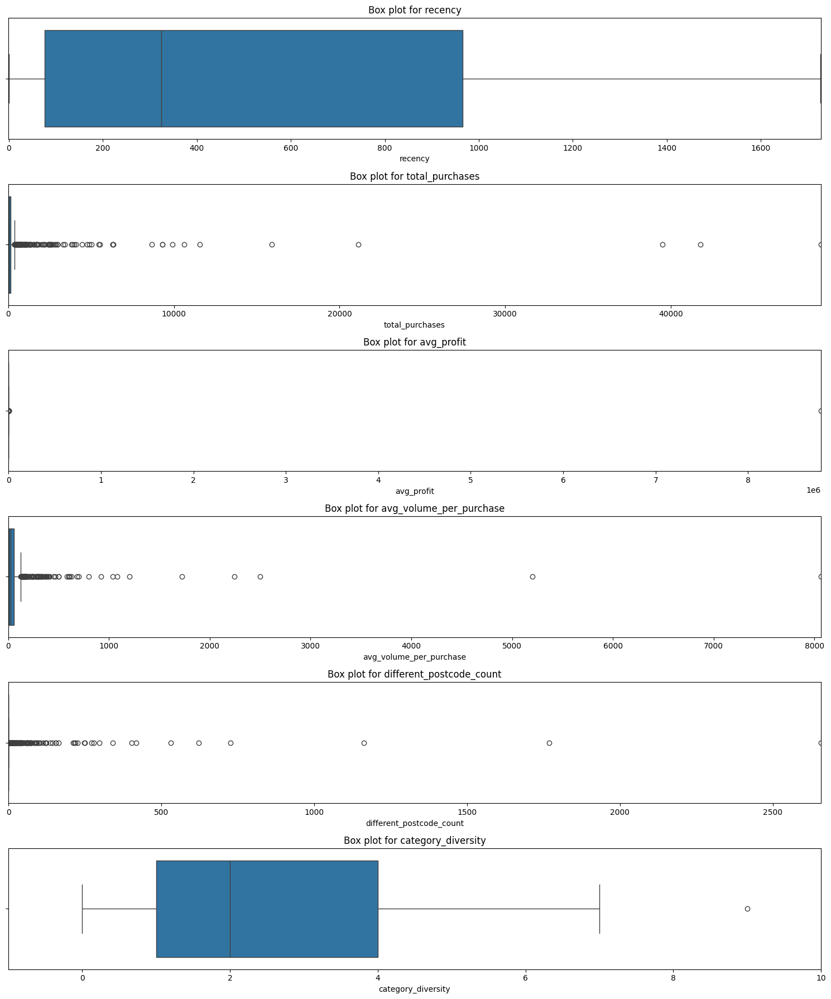

In [ ]:
plot_box_plots(user_features)

It is worth paying attention to the distribution of the last two features. In the first case, 0 is dominant, which can create a lot of noise during clustering. In addition, we are interested in buyers who have a value >= 1 for this feature. In this regard, it seems logical to separate the clustering of users with different deliveries separately

---



In addition, there is a natural distribution of numbers from 0 to 9 for category_diversity. When clustering, this can be a feature killer, so it was decided to consider the impact of this feature through statistical tests

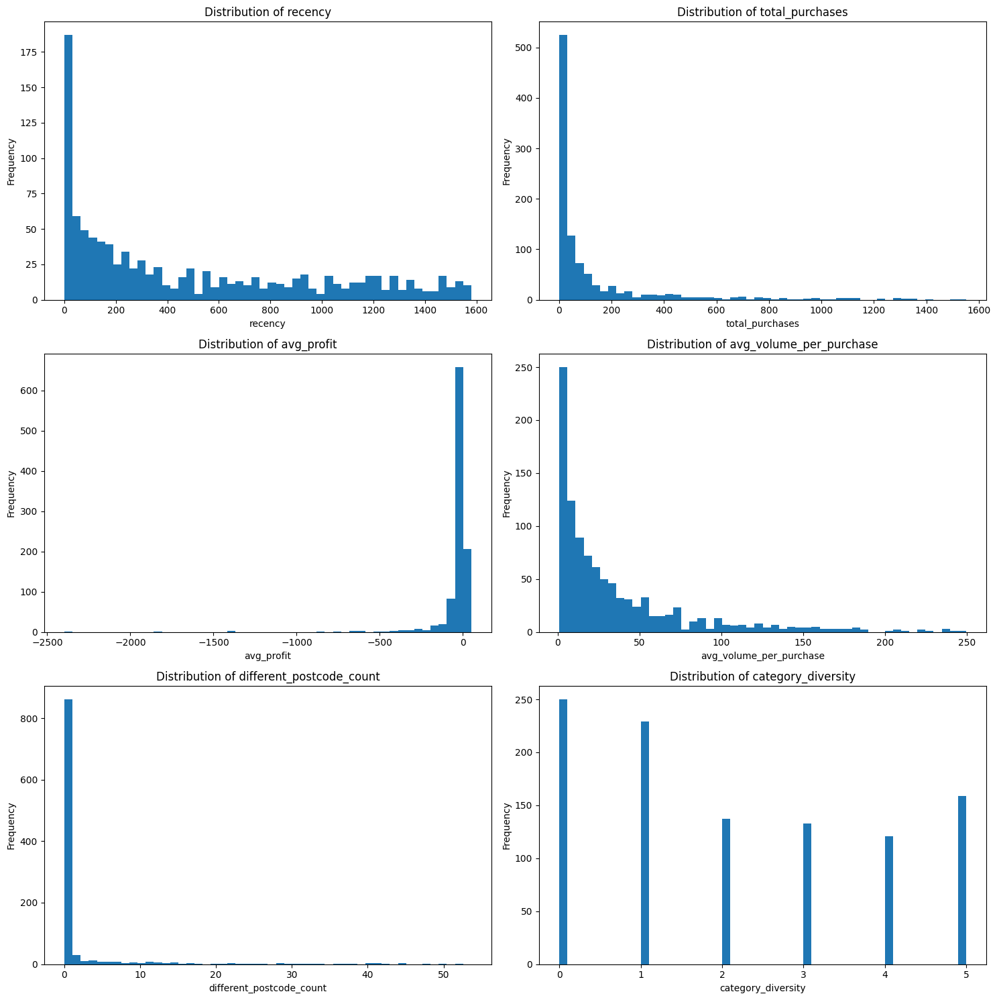

In [ ]:
plot_features_density(user_features)

### Bivariate statistics for users

There are no unnatural correlations on this graph that could not be explained by common sense or randomness.

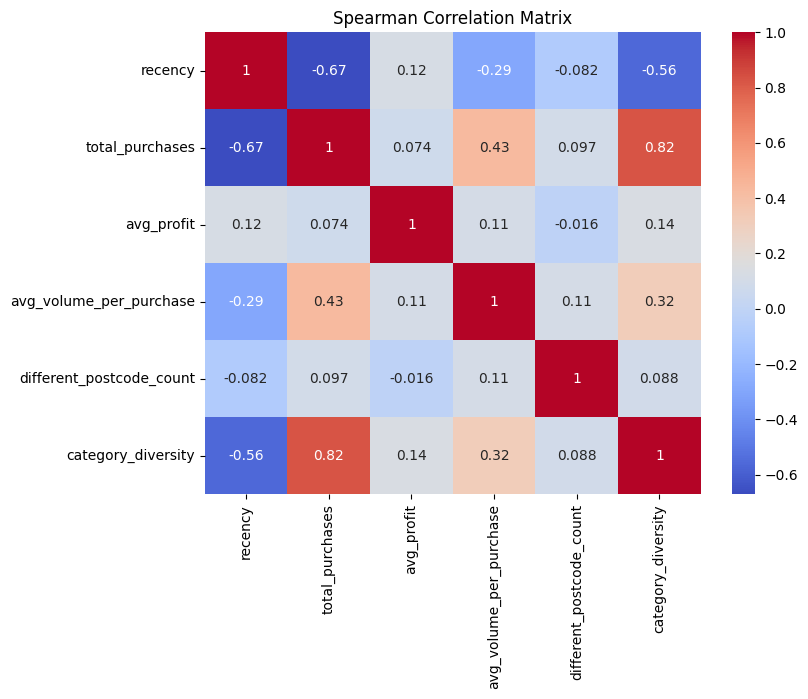

In [ ]:
corr_matrix = user_features.corr(method='spearman')

plt.figure(figsize=(8, 6))

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

plt.title('Spearman Correlation Matrix')

plt.show()

# Data preporation (SEMEN)

### Outliers removal

We remove outliers from previously discovered features so as not to create unnecessary noise during clustering

In [ ]:
new_user_features = remove_outliers_by_quantile(user_features, ['avg_profit', 'recency', 'total_purchases'])
new_user_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count,category_diversity
count,755.000000,755.000000,755.000000,755.000000,755.000000,755.000000
mean,637.798675,57.006623,-9.536435,40.929127,3.784106,1.895364
std,538.811413,77.950700,18.216297,117.270196,13.321957,1.646769
min,0.000000,1.000000,-62.956378,1.000000,0.000000,0.000000
25%,152.000000,6.000000,-18.135965,5.000000,0.000000,0.000000
50%,481.000000,22.000000,-6.346945,15.500000,0.000000,1.000000
75%,1125.500000,77.000000,0.239978,37.437909,0.000000,3.000000
max,1727.000000,372.000000,38.827034,2500.000000,137.000000,6.000000


**PLEASE NOTE!**

After removing the outliers by quantile methods, avg_profit got a **negative** mean. From this, it can be concluded that the positive average was based on **very significant, but few positive outliers**. This means that the company is **heavily dependent on a small number of customers**. It can be assumed that due to the one-time funds received, she sells at a loss to **increase its customer base**

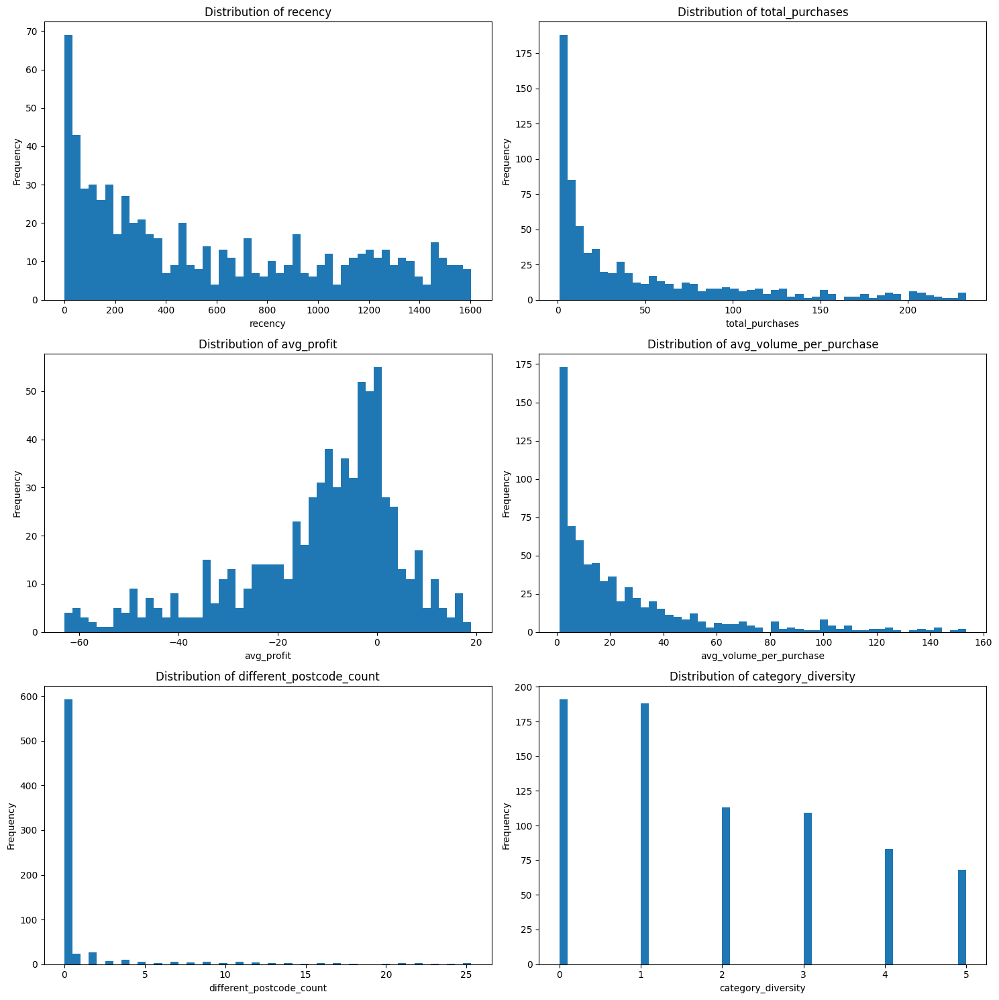

In [ ]:
plot_features_density(new_user_features)

### Killer features removal

In [ ]:
new_user_features = new_user_features.drop(columns=['category_diversity', 'different_postcode_count'])
new_user_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
0,1450,1,-2.530000,1.000000
4,145,109,-10.865057,12.064220
6,1181,3,-2.963333,1.000000
21,1618,4,8.907500,1.000000
22,629,22,-11.875741,11.954545
...,...,...,...,...
2480,670,1,-7.330000,300.000000
2486,1009,209,33.943529,328.205742
2491,13,22,-22.578655,15.545455


In [ ]:
new_user_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,755.000000,755.000000,755.000000,755.000000
mean,637.798675,57.006623,-9.536435,40.929127
std,538.811413,77.950700,18.216297,117.270196
min,0.000000,1.000000,-62.956378,1.000000
25%,152.000000,6.000000,-18.135965,5.000000
50%,481.000000,22.000000,-6.346945,15.500000
75%,1125.500000,77.000000,0.239978,37.437909
max,1727.000000,372.000000,38.827034,2500.000000


### Scaling

The Z-transformation was used to eliminate the significant difference in mean and variance and to compact the results

In [ ]:
scaler = StandardScaler()

scaled_features = pd.DataFrame(scaler.fit_transform(new_user_features), columns=new_user_features.columns, index=new_user_features.index)
scaled_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
0,1.508394,-0.718964,0.384880,-0.340714
4,-0.915210,0.667446,-0.072984,-0.246303
6,1.008816,-0.693290,0.361076,-0.340714
21,1.820398,-0.680453,1.013168,-0.340714
22,-0.016341,-0.449384,-0.128503,-0.247239
...,...,...,...,...
2480,0.059803,-0.718964,0.121205,2.210644
2486,0.689383,1.951158,2.388454,2.451322
2491,-1.160356,-0.449384,-0.716439,-0.216598


In [ ]:
scaled_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,7.550000e+02,7.550000e+02,7.550000e+02,7.550000e+02
mean,7.058372e-17,1.646953e-17,4.705581e-18,-1.176395e-17
std,1.000663e+00,1.000663e+00,1.000663e+00,1.000663e+00
min,-1.184499e+00,-7.189640e-01,-2.934480e+00,-3.407140e-01
25%,-9.022094e-01,-6.547784e-01,-4.723919e-01,-3.065821e-01
50%,-2.912014e-01,-4.493844e-01,1.752060e-01,-2.169859e-01
75%,9.057429e-01,2.566575e-01,5.370408e-01,-2.979046e-02
max,2.022829e+00,4.043609e+00,2.656716e+00,2.098317e+01


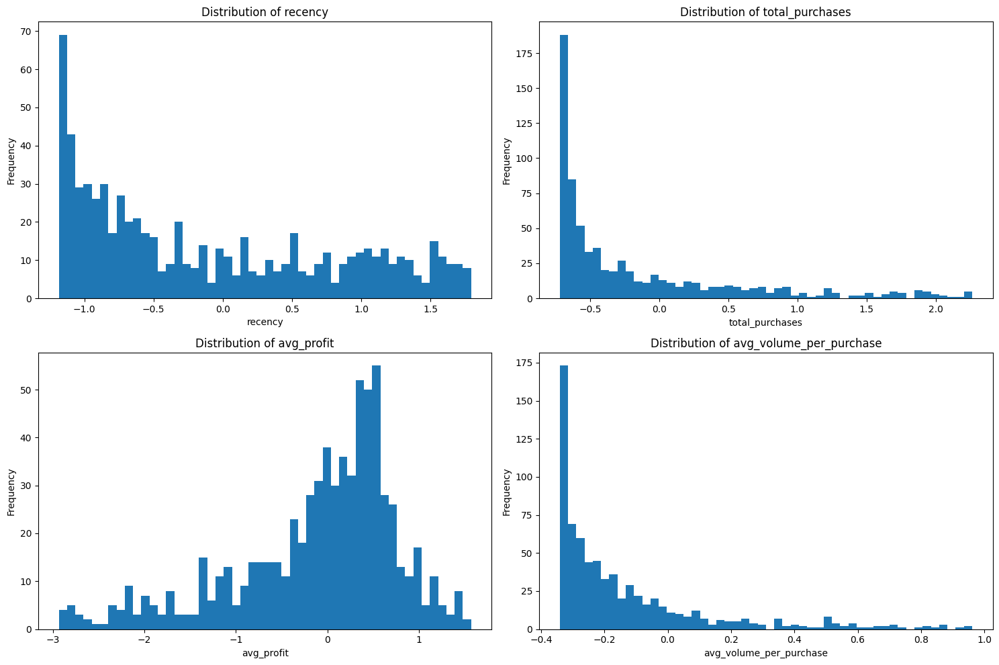

In [ ]:
plot_features_density(scaled_features)

### Apply weights

To eliminate the fact of lost information, the method of weights based on standard deviation (not variance for cluster compaction) was applied

In [ ]:
original_std = new_user_features.std()

weights = 1 / original_std
weights /= weights.sum()

print(weights)

scaled_features = scaled_features * weights.values
scaled_features

recency                    0.023761
total_purchases            0.164243
avg_profit                 0.702822
avg_volume_per_purchase    0.109174
dtype: float64


,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
0,0.035841,-0.118084,0.270502,-0.037197
4,-0.021747,0.109623,-0.051295,-0.026890
6,0.023971,-0.113868,0.253772,-0.037197
21,0.043255,-0.111759,0.712077,-0.037197
22,-0.000388,-0.073808,-0.090315,-0.026992
...,...,...,...,...
2480,0.001421,-0.118084,0.085185,0.241344
2486,0.016381,0.320463,1.678659,0.267620
2491,-0.027571,-0.073808,-0.503529,-0.023647


In [ ]:
scaled_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,7.550000e+02,7.550000e+02,7.550000e+02,7.550000e+02
mean,1.470494e-18,2.352791e-18,9.411162e-18,-2.352791e-18
std,2.377698e-02,1.643514e-01,7.032884e-01,1.092461e-01
min,-2.814515e-02,-1.180845e-01,-2.062418e+00,-3.719701e-02
25%,-2.143761e-02,-1.075425e-01,-3.320077e-01,-3.347071e-02
50%,-6.919303e-03,-7.380805e-02,1.231387e-01,-2.368916e-02
75%,2.152157e-02,4.215409e-02,3.774443e-01,-3.252335e-03
max,4.806491e-02,6.641328e-01,1.867200e+00,2.290811e+00


# Clustering (SEMEN)

To form a user group based on 4 main features, 3 clustering models were created and compared: **KMeans, DBSCAN, HDBSCAN**

The following criteria were selected to evaluate the models:
*   **Silhouette Score**: Measures how similar each point is to its own cluster compared to other clusters; higher values indicate better-defined clusters (range: -1 to 1).
*   **Davies-Bouldin Index**: Evaluates intra-cluster similarity and inter-cluster separation; lower values suggest better clustering quality.
* **Calinski-Harabasz Index**: Assesses the ratio of between-cluster dispersion to within-cluster dispersion; higher values indicate well-separated and compact clusters.

After selecting the model, a **PCA analysis** was performed on it, which demonstrated the impact of a specific feature on a specific cluster. The final conclusions were made on the basis of it and projections on 2 and 3D spaces


## KMeans

### Elbow method

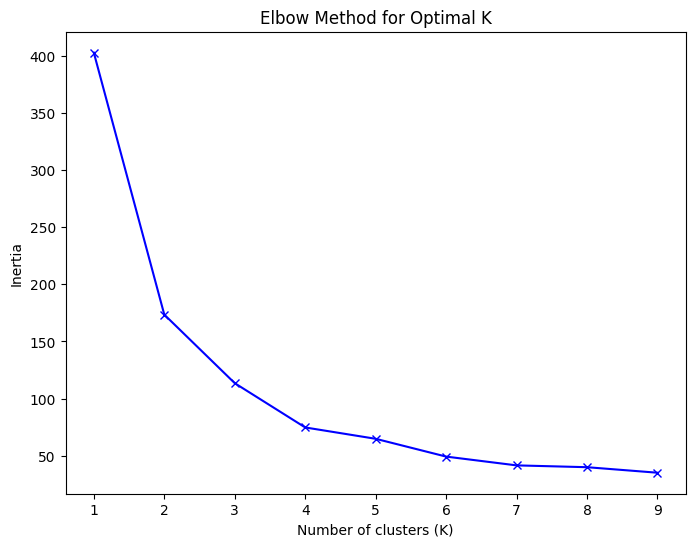

In [ ]:
elbow_method(scaled_features)

### KMeans train

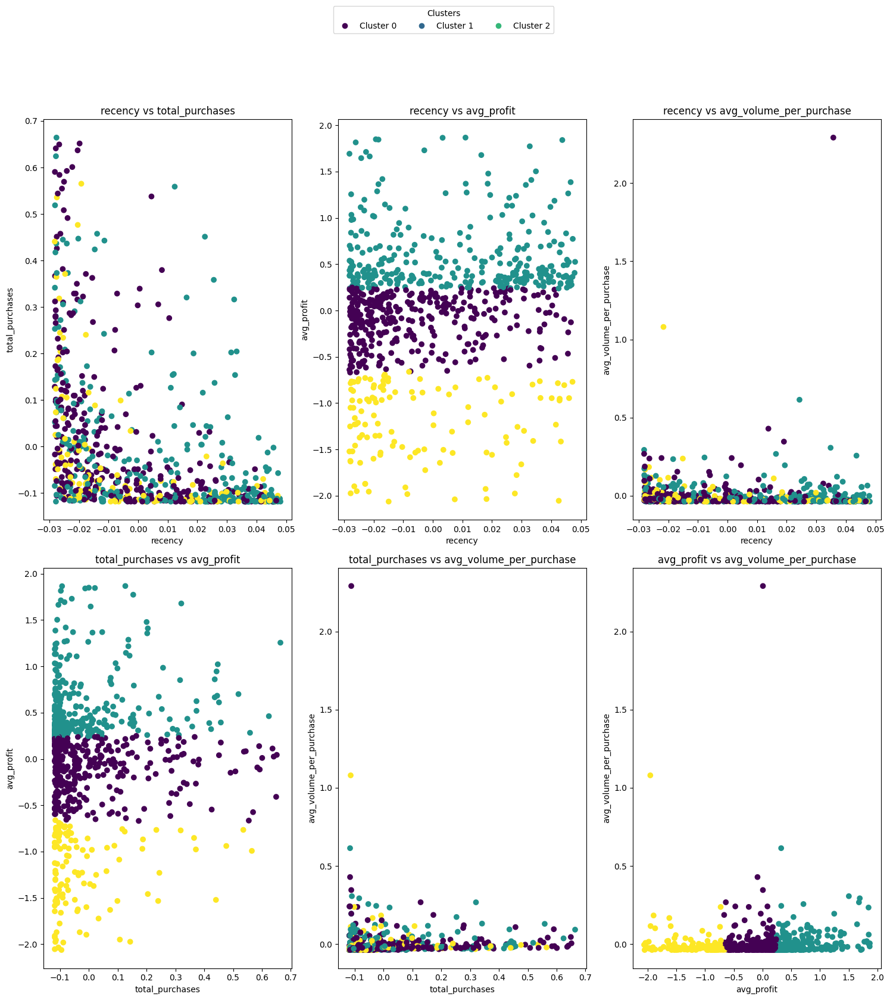

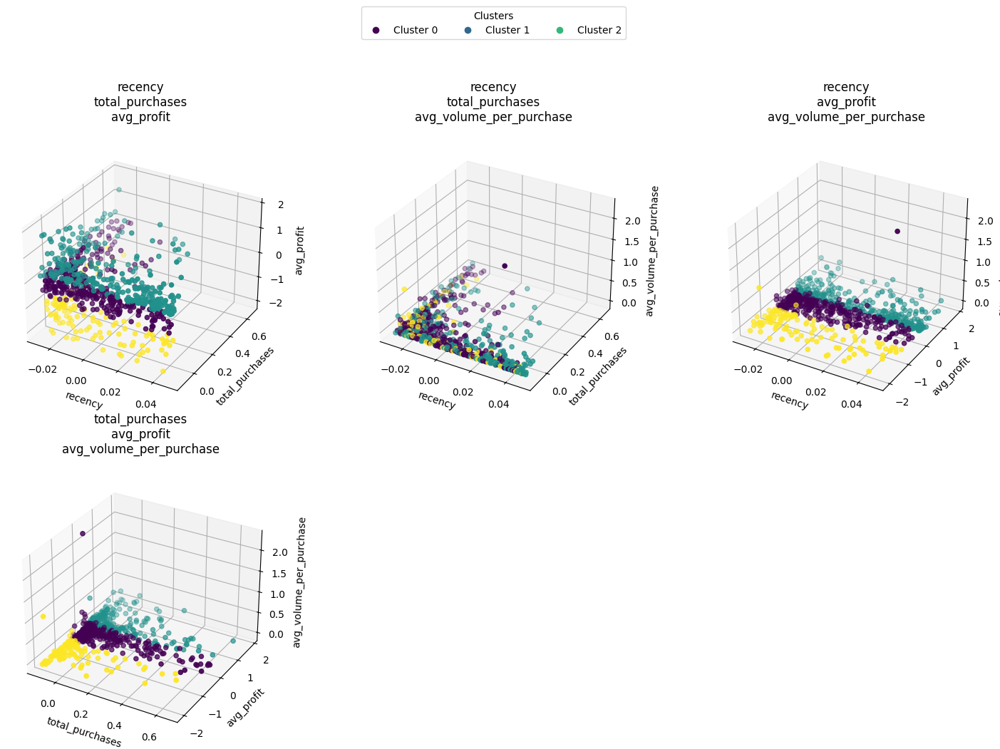

In [ ]:
CHOSEN_K = 3

kmeans_labels = perform_kmeans_clustering(scaled_features, CHOSEN_K)

### Metrics

In [ ]:
calculate_kmeans_metrics(scaled_features, kmeans_labels)

Silhouette Score: 0.3999686050629083
Davies-Bouldin Index: 0.791491990641673
Calinski-Harabasz Index: 959.0518251654629


To select HDDSCAN hyperparameters (HDBSCAN), the following approach was chosen:
1. KNN is used to determine eps
2. min_samples = number of features * 2

## DBSCAN

In [ ]:
AMOUNT_OF_FEATURES = 4
MIN_SAMPLES = AMOUNT_OF_FEATURES * 2

### Epsilon definition

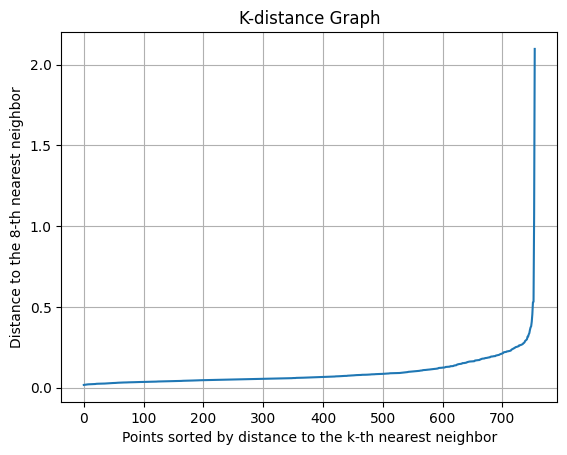

In [ ]:
eps_definition_knn(scaled_features, MIN_SAMPLES)

### DBSCAN training

[-1  0  1  2]


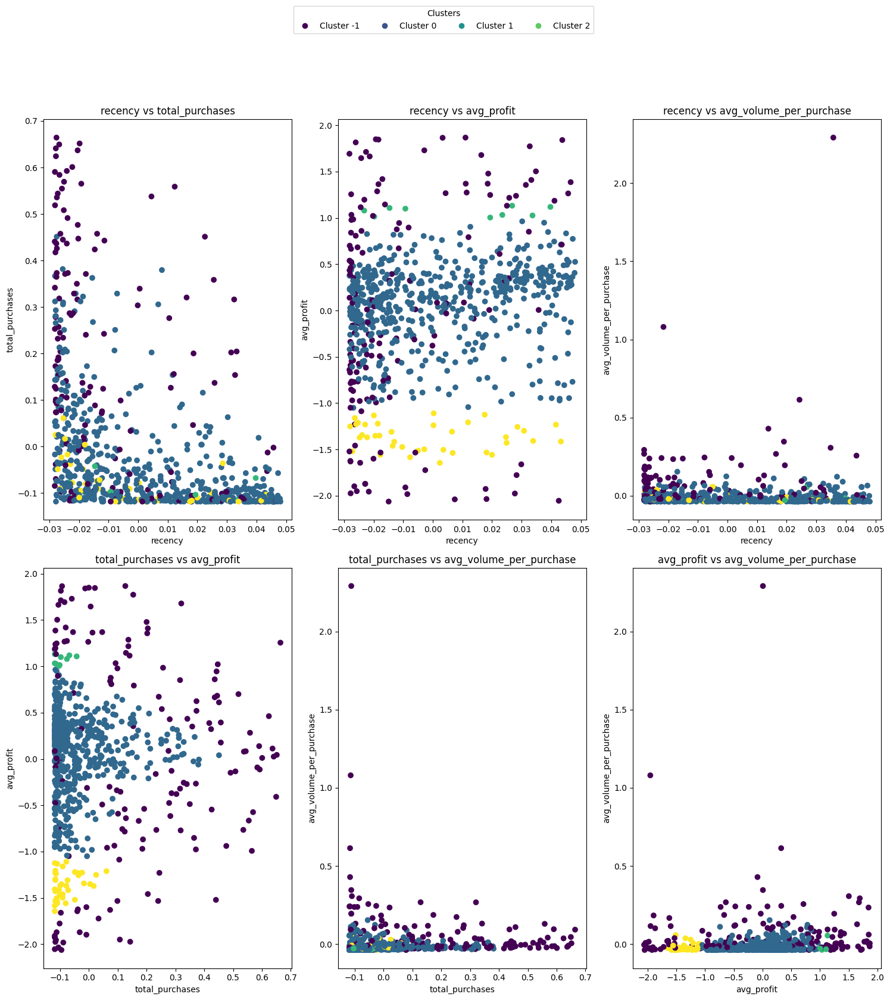

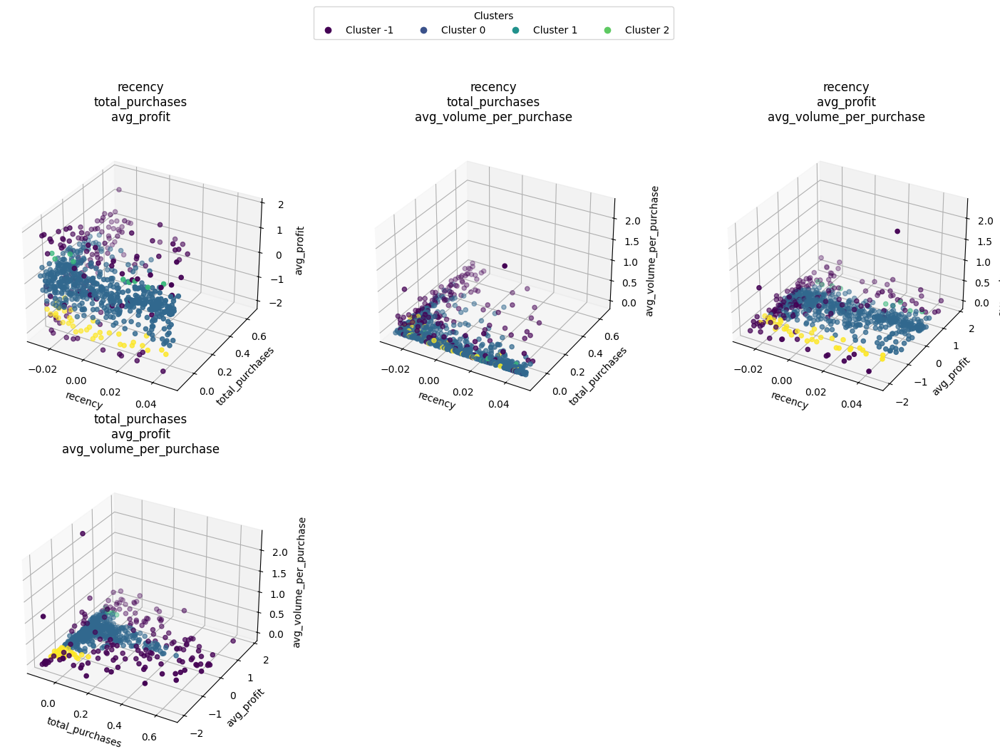

In [ ]:
dbscan_labels = perform_dbscan_clustering(scaled_features, 0.1, MIN_SAMPLES)

### Metrics

In [ ]:
calculate_dbscan_metrics(scaled_features, dbscan_labels)

Silhouette Score: 0.38830979254306563
Davies-Bouldin Index: 0.3904763884237325
Сalinski-Harabasz Index: 249.74156085530842


## HDBSCAN

### HDBSCAN training

[-1  0  1]


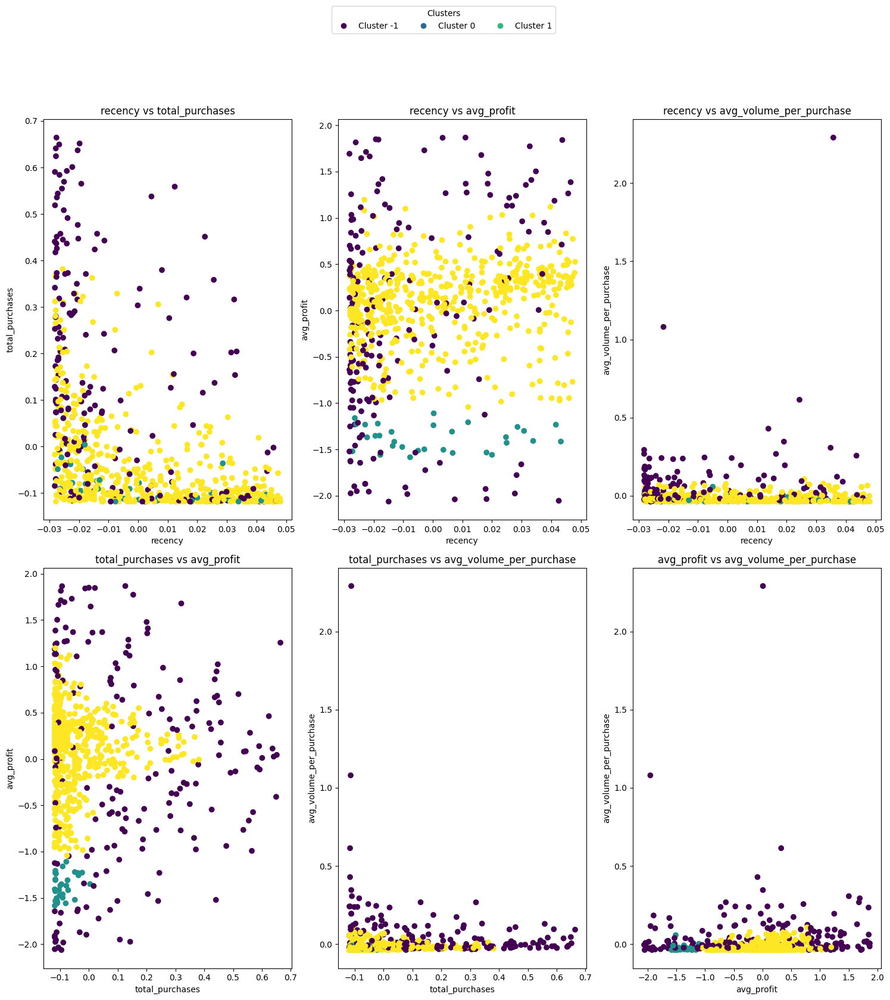

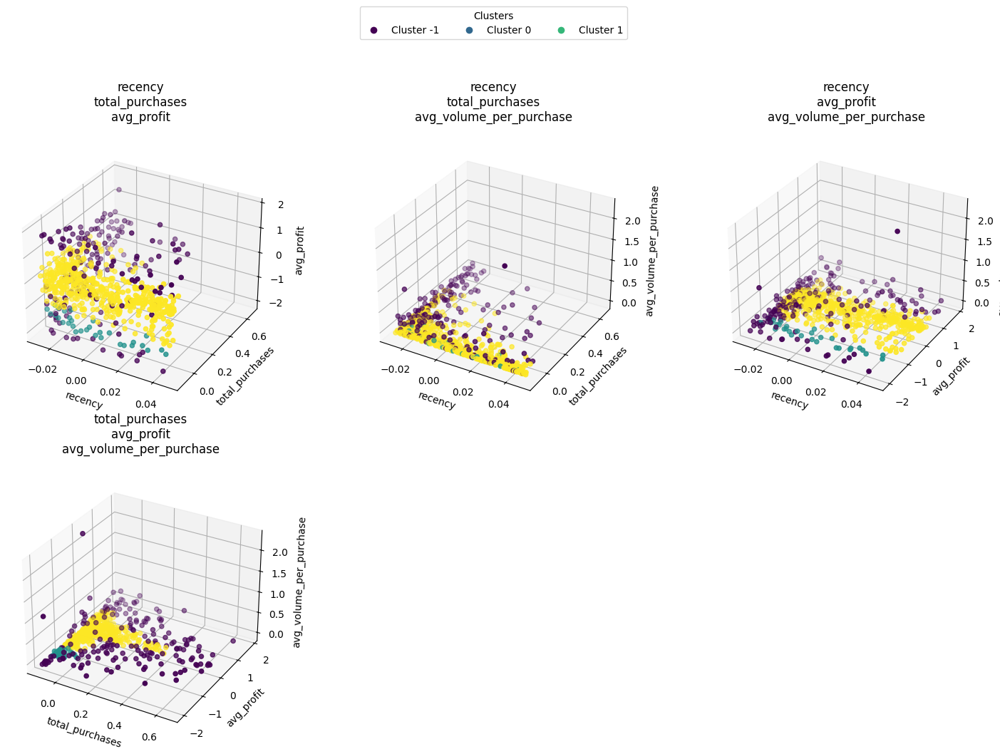

In [ ]:
hdbscan_labels = perform_hdbscan_clustering(scaled_features, MIN_SAMPLES)

### Metrics

In [ ]:
calculate_dbscan_metrics(scaled_features, hdbscan_labels)

Silhouette Score: 0.62030044114729
Davies-Bouldin Index: 0.3229154896799678
Сalinski-Harabasz Index: 364.7584297765404


As a result, the **HDBSCAN model** won in all three metrics

## PCA analysis

In [ ]:
CHOSEN_LABELS = hdbscan_labels

In [ ]:
result_features_pca = PCA(n_components=2)
scaled_features_pca = result_features_pca.fit_transform(scaled_features)

### Explained variance

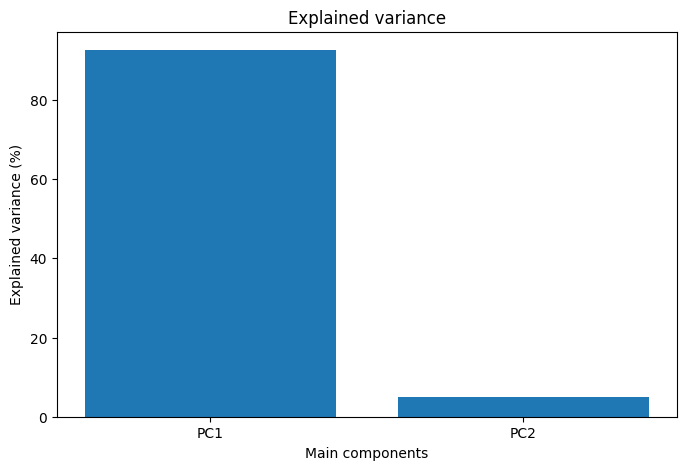

In [ ]:
calculate_explained_variance(result_features_pca)

### Clusering projection

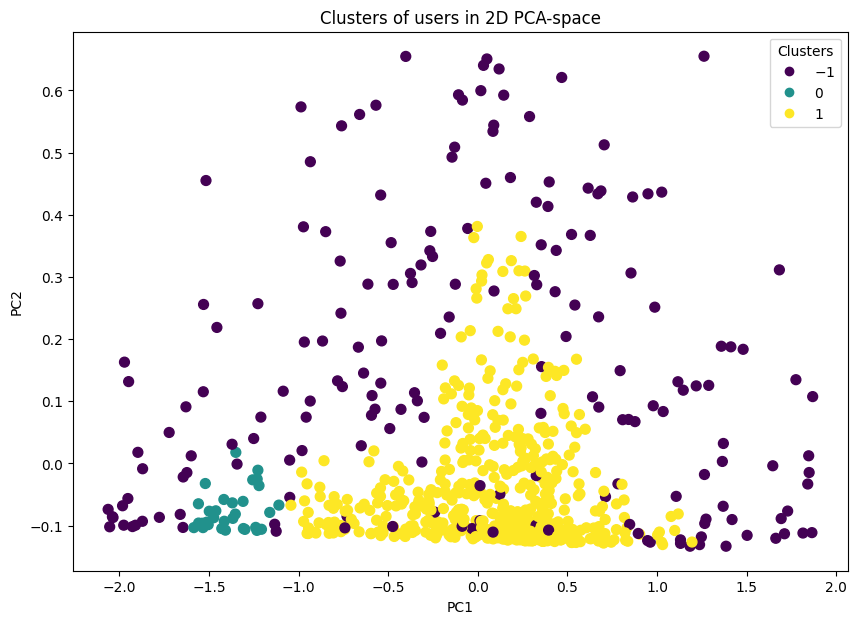

In [ ]:
df_pca = pd.DataFrame(scaled_features_pca, columns=['PC1', 'PC2'])

fig, ax = plt.subplots(figsize=(10, 7))
scatter = ax.scatter(df_pca['PC1'], df_pca['PC2'], c=CHOSEN_LABELS, cmap='viridis', s=50)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
plt.title('Clusters of users in 2D PCA-space')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

### Feature vs component vs cluster

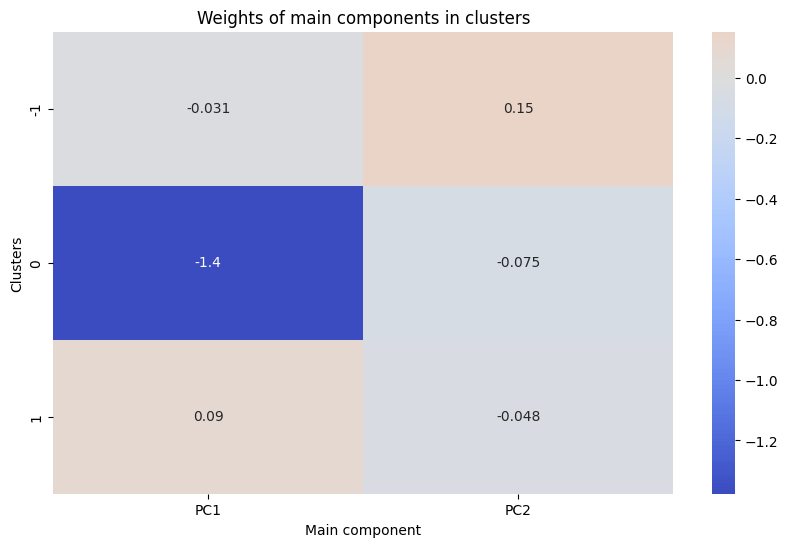

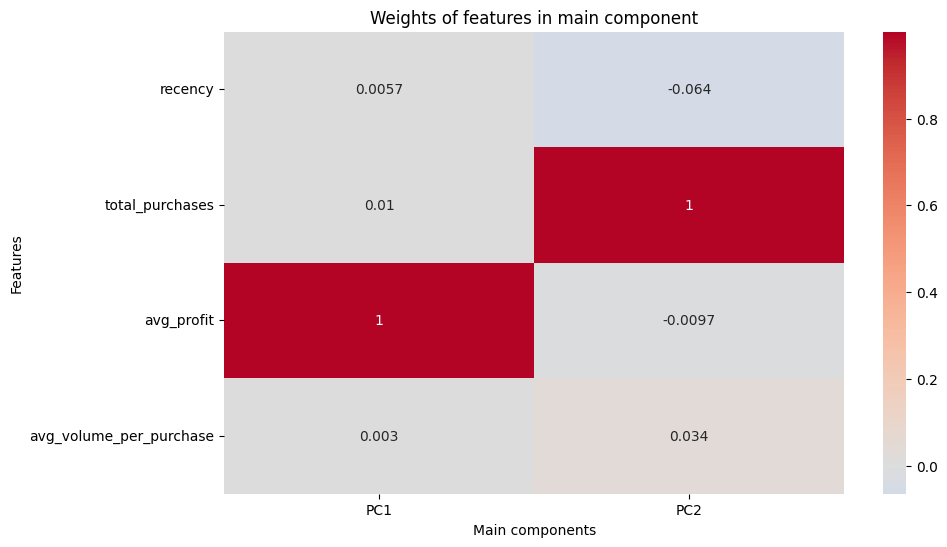

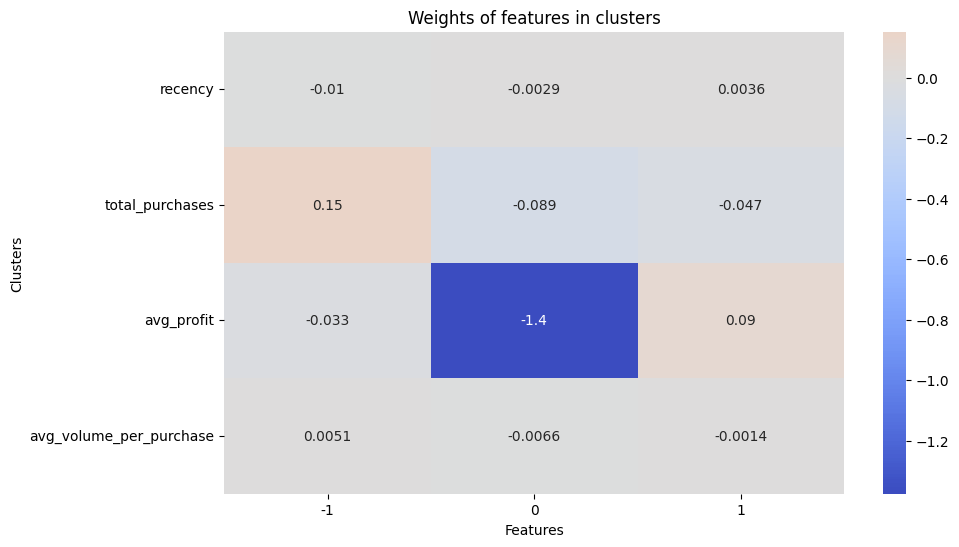

In [ ]:
calculate_pca_dependencies(df_pca, CHOSEN_LABELS, scaled_features, result_features_pca)

As can be seen by the heatmap of the effects of features on clusters, the following **3 groups** are formed on the 4 main features:

1. Low-profit customers who make a relatively small number of purchases (cluster 0). Most likely, these are buyers who participate exclusively in promotions. Their number is significantly less than the number of other buyers
2. Average buyers who have a small negative profit (remember that 0 after scaling is an analog of a negative number for this feature), but at the same time buying very few goods (cluster 1). We cannot say that these customers are loyal to the company, but we can say that they make up the majority.
3. The model attributed the last category of buyers to emissions, however, based on the graph, it can be concluded that it is actually the least profitable category of buyers for the company, since on average it buys a lot of low-profile goods. The strongest emissions that were cleared before clustering can be attributed to the same category (a large profit also creates a negative effect for the company)

# Data preporation (drop shippers) - (SEMEN)

In this chapter, the data of people who sent goods not to their postcode is being prepared. The purpose of this and the next chapter is to identify dropshippers and whether they are a problem for the company. The process of data preparation and clustering is the same as in the previous 2 chapters

### Exacting dropshippers

In [ ]:
dropshippers_user_features = user_features[user_features['different_postcode_count'] > 0]
dropshippers_user_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count,category_diversity
count,234.000000,234.000000,234.000000,234.000000,234.000000,234.000000
mean,482.991453,372.474359,-7.655737,93.257375,69.213675,2.401709
std,485.198813,1183.715081,226.456284,531.448244,236.196300,1.932597
min,0.000000,1.000000,-842.237343,1.000000,1.000000,0.000000
25%,89.750000,8.000000,-25.825169,9.984244,3.000000,1.000000
50%,279.000000,38.000000,-8.928612,24.510894,11.000000,2.000000
75%,831.000000,186.500000,0.715568,64.924942,44.750000,4.000000
max,1700.000000,9296.000000,2759.408305,8065.287671,2657.000000,7.000000


### Outliers removal

In [ ]:
dropshippers_user_features = remove_outliers_by_quantile(user_features, ['avg_profit', 'recency', 'total_purchases'])
dropshippers_user_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count,category_diversity
count,755.000000,755.000000,755.000000,755.000000,755.000000,755.000000
mean,637.798675,57.006623,-9.536435,40.929127,3.784106,1.895364
std,538.811413,77.950700,18.216297,117.270196,13.321957,1.646769
min,0.000000,1.000000,-62.956378,1.000000,0.000000,0.000000
25%,152.000000,6.000000,-18.135965,5.000000,0.000000,0.000000
50%,481.000000,22.000000,-6.346945,15.500000,0.000000,1.000000
75%,1125.500000,77.000000,0.239978,37.437909,0.000000,3.000000
max,1727.000000,372.000000,38.827034,2500.000000,137.000000,6.000000


### Killer feature removal

In [ ]:
dropshippers_user_features = dropshippers_user_features.drop(columns=['category_diversity'])
dropshippers_user_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count
customer,,,,,
0,1450,1,-2.530000,1.000000,0.0
4,145,109,-10.865057,12.064220,0.0
6,1181,3,-2.963333,1.000000,0.0
21,1618,4,8.907500,1.000000,0.0
22,629,22,-11.875741,11.954545,0.0
...,...,...,...,...,...
2480,670,1,-7.330000,300.000000,1.0
2486,1009,209,33.943529,328.205742,41.0
2491,13,22,-22.578655,15.545455,16.0


### Scaling

In [ ]:
drop_scaler = StandardScaler()

drop_scaled_features = pd.DataFrame(drop_scaler.fit_transform(dropshippers_user_features), columns=dropshippers_user_features.columns, index=dropshippers_user_features.index)
drop_scaled_features

,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count
customer,,,,,
0,1.508394,-0.718964,0.384880,-0.340714,-0.284239
4,-0.915210,0.667446,-0.072984,-0.246303,-0.284239
6,1.008816,-0.693290,0.361076,-0.340714,-0.284239
21,1.820398,-0.680453,1.013168,-0.340714,-0.284239
22,-0.016341,-0.449384,-0.128503,-0.247239,-0.284239
...,...,...,...,...,...
2480,0.059803,-0.718964,0.121205,2.210644,-0.209125
2486,0.689383,1.951158,2.388454,2.451322,2.795427
2491,-1.160356,-0.449384,-0.716439,-0.216598,0.917582


### Apply weights

In [ ]:
original_std = dropshippers_user_features.std()

weights = 1 / original_std
weights /= weights.sum()

print(weights)

drop_scaled_features = drop_scaled_features * weights.values
drop_scaled_features

recency                     0.012117
total_purchases             0.083753
avg_profit                  0.358394
avg_volume_per_purchase     0.055672
different_postcode_count    0.490064
dtype: float64


,recency,total_purchases,avg_profit,avg_volume_per_purchase,different_postcode_count
customer,,,,,
0,0.018277,-0.060215,0.137939,-0.018968,-0.139295
4,-0.011089,0.055901,-0.026157,-0.013712,-0.139295
6,0.012224,-0.058065,0.129407,-0.018968,-0.139295
21,0.022057,-0.056990,0.363113,-0.018968,-0.139295
22,-0.000198,-0.037637,-0.046055,-0.013764,-0.139295
...,...,...,...,...,...
2480,0.000725,-0.060215,0.043439,0.123070,-0.102485
2486,0.008353,0.163416,0.856008,0.136469,1.369939
2491,-0.014060,-0.037637,-0.256768,-0.012058,0.449674


# Clustering (drop shippers) - (SEMEN)

## KMeans

### Elbow method

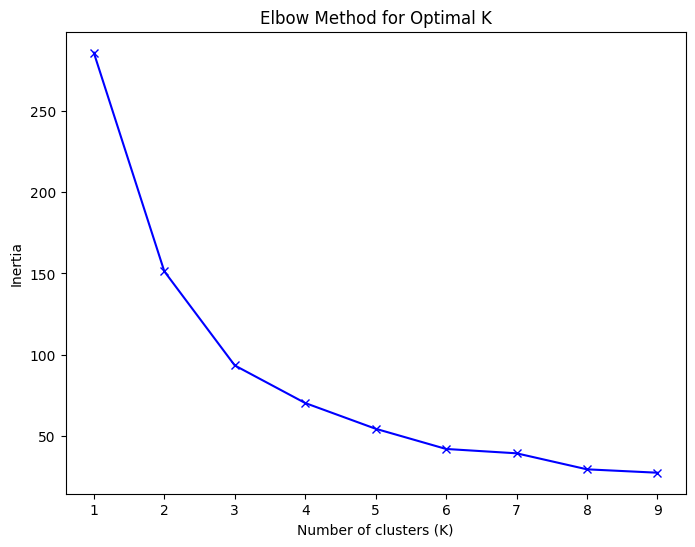

In [ ]:
elbow_method(drop_scaled_features)

### KMeans train

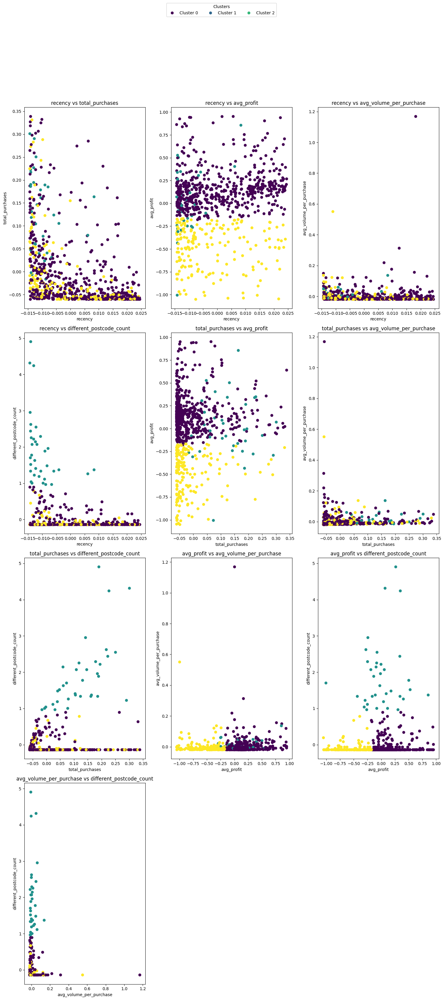

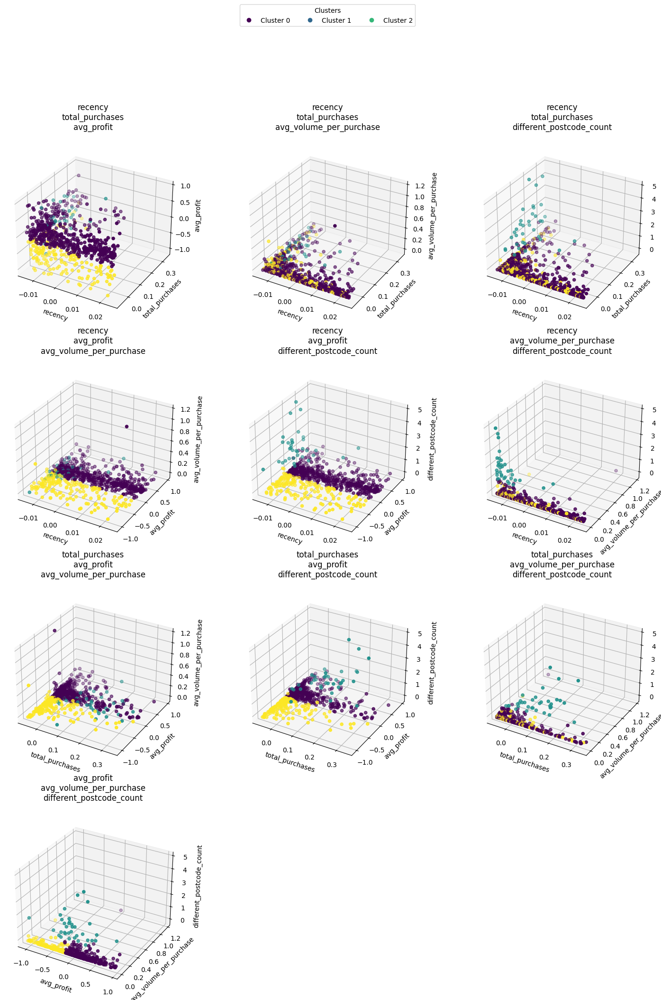

In [ ]:
CHOSEN_K = 3

drop_kmeans_labels = perform_kmeans_clustering(drop_scaled_features, CHOSEN_K)

### Metrics

In [ ]:
calculate_kmeans_metrics(drop_scaled_features, drop_kmeans_labels)

Silhouette Score: 0.5142120775986085
Davies-Bouldin Index: 0.6359363540521032
Calinski-Harabasz Index: 776.7005845202484


## DBSCAN

In [ ]:
AMOUNT_OF_FEATURES = 5
MIN_SAMPLES = AMOUNT_OF_FEATURES * 2

### Epsilon definition

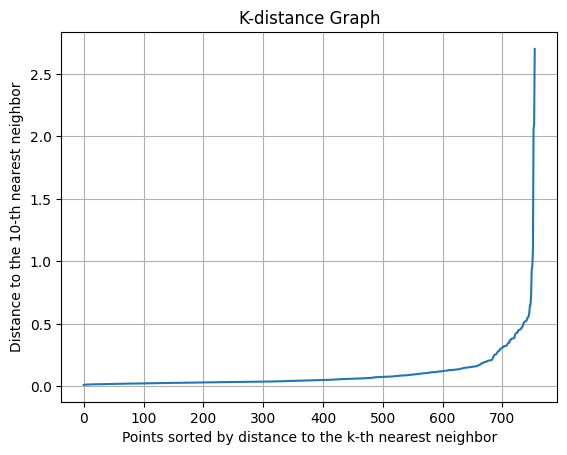

In [ ]:
eps_definition_knn(drop_scaled_features, MIN_SAMPLES)

### DBSCAN training

[-1  0  1]


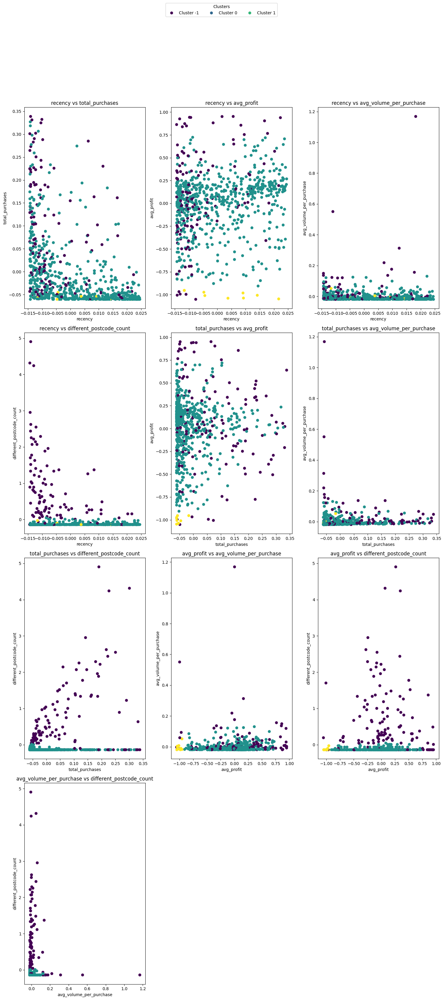

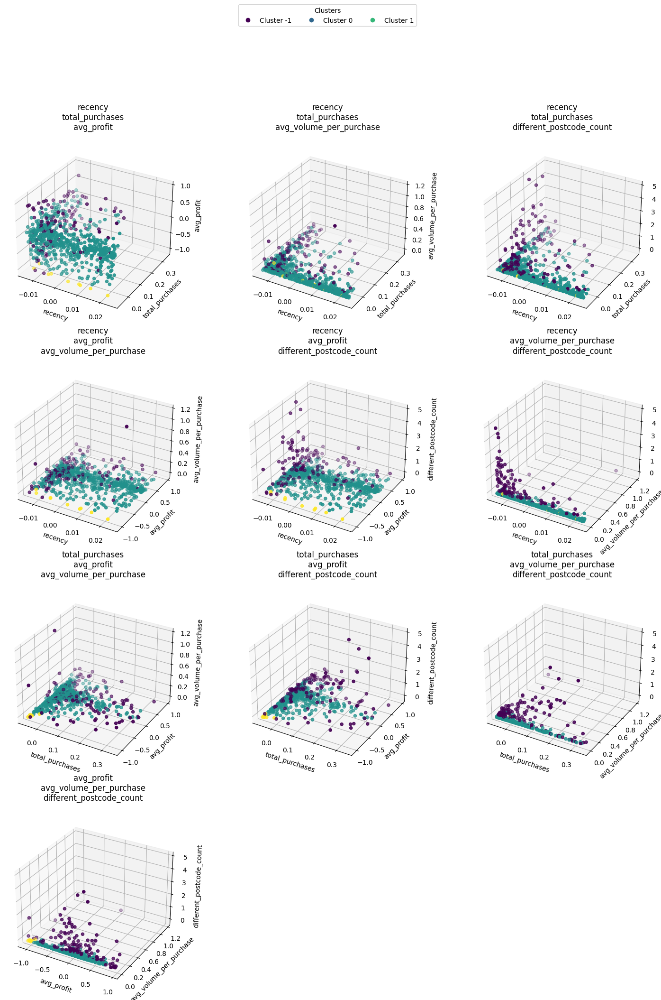

In [ ]:
drop_dbscan_labels = perform_dbscan_clustering(drop_scaled_features, 0.1, MIN_SAMPLES)

## Metrics

In [ ]:
calculate_dbscan_metrics(drop_scaled_features, drop_dbscan_labels)

Silhouette Score: 0.5736293445708136
Davies-Bouldin Index: 0.3036026614041103
Сalinski-Harabasz Index: 88.9211560917517


## HDBSCAN

### HDBSCAN training

[-1  0  1]


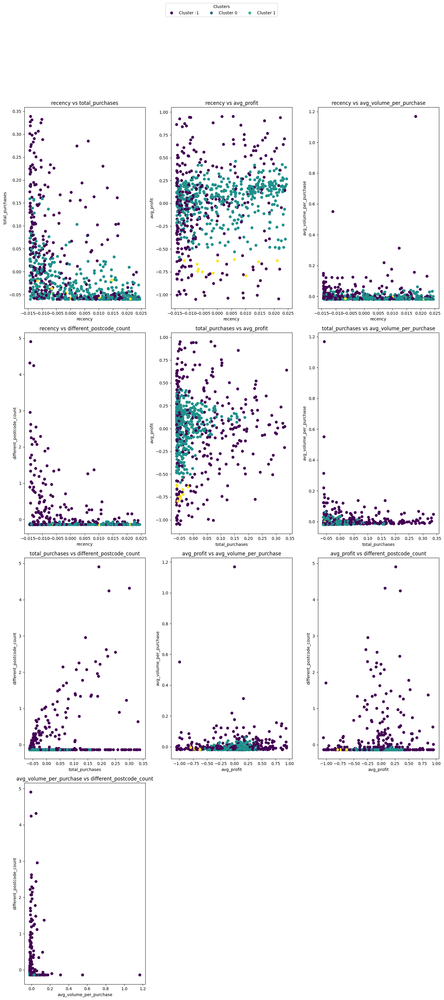

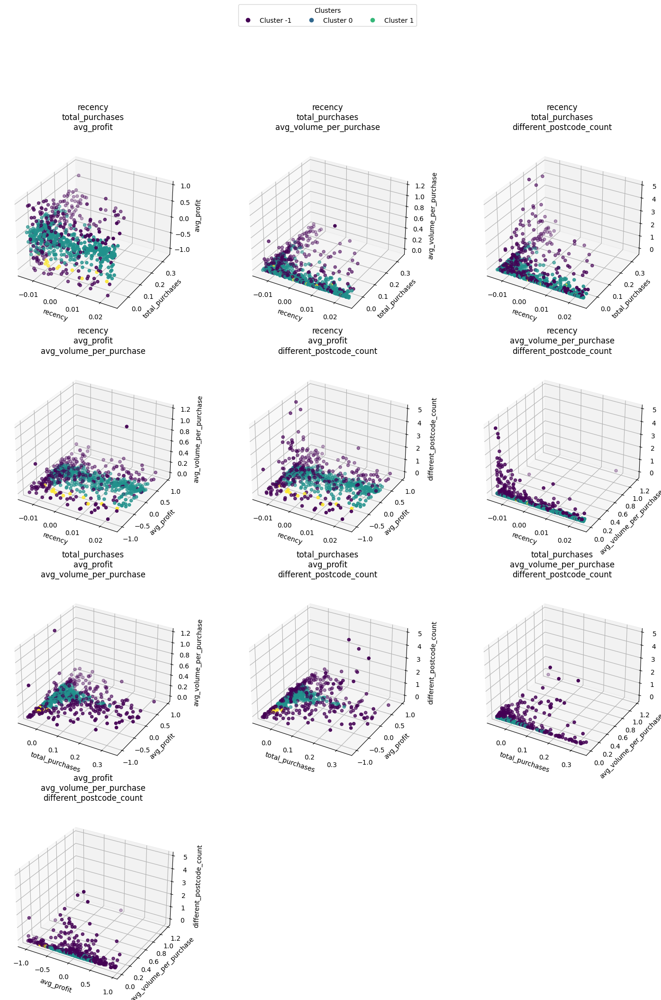

In [ ]:
drop_hdbscan_labels = perform_hdbscan_clustering(drop_scaled_features, MIN_SAMPLES)

### Metrics

In [ ]:
calculate_dbscan_metrics(drop_scaled_features, drop_hdbscan_labels)

Silhouette Score: 0.6068015910723086
Davies-Bouldin Index: 0.3244317198551072
Сalinski-Harabasz Index: 129.43661878858768


Despite the higher quality indicators of the first two metrics for HDDSCAN, the indicator of the third metric for K Means significantly exceeds all expectations, so this model was chosen to summarize the results

## PCA analysis

In [ ]:
CHOSEN_LABELS = drop_kmeans_labels

In [ ]:
result_drop_features_pca = PCA(n_components=2)
drop_features_pca = result_drop_features_pca.fit_transform(drop_scaled_features)

### Explained variance

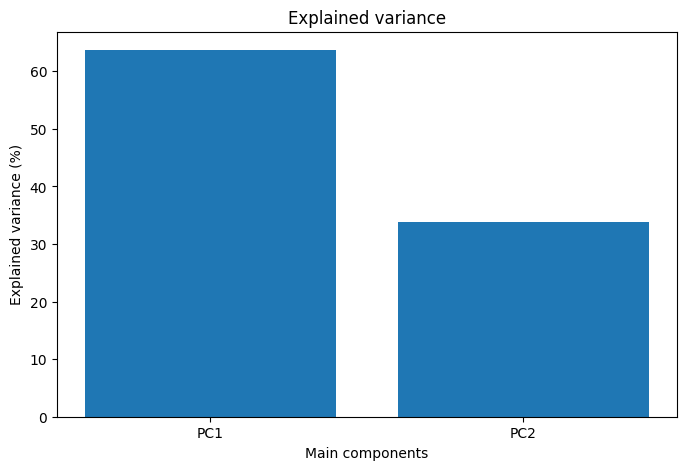

In [ ]:
calculate_explained_variance(result_drop_features_pca)

### Clusering projection

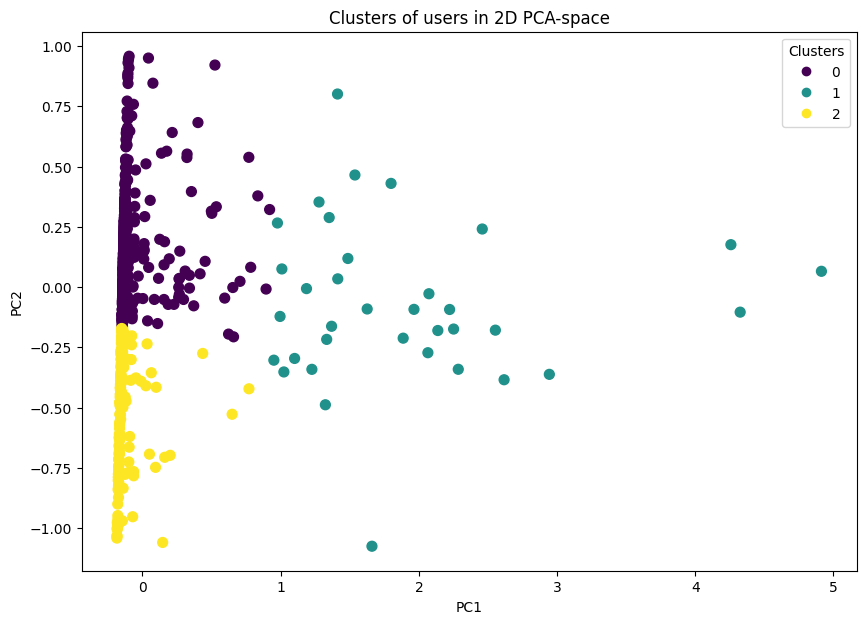

In [ ]:
drop_df_pca = pd.DataFrame(drop_features_pca, columns=['PC1', 'PC2'])

fig, ax = plt.subplots(figsize=(10, 7))
scatter = ax.scatter(drop_df_pca['PC1'], drop_df_pca['PC2'], c=CHOSEN_LABELS, cmap='viridis', s=50)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
plt.title('Clusters of users in 2D PCA-space')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

### Feature vs component vs cluster

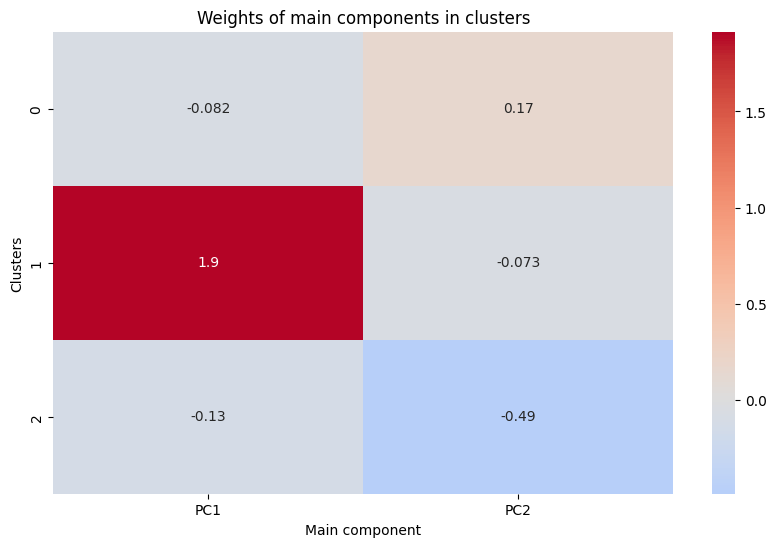

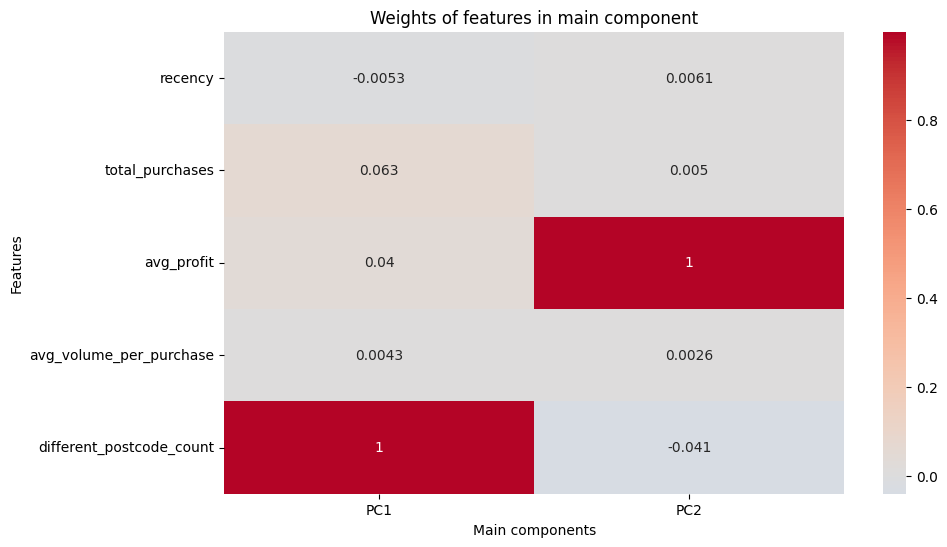

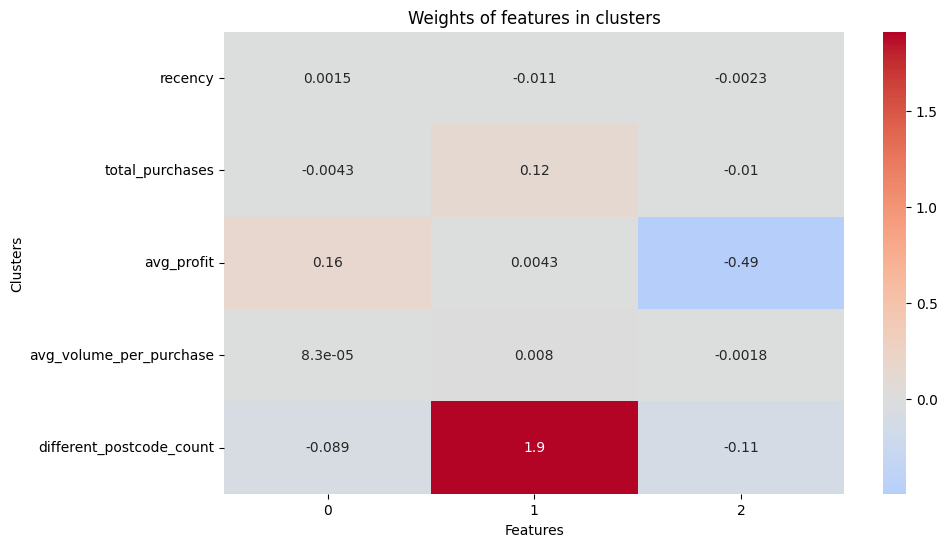

In [ ]:
calculate_pca_dependencies(drop_df_pca, CHOSEN_LABELS, drop_scaled_features, result_drop_features_pca)

As a result of the analysis, there are **3 main groups** of buyers who redirect their goods to another address:

1. Ordinary customers who participate only in promotions and have a small profit (cluster 2).

2. Ordinary customers who bring a small profit for the company and buy less than the average. (cluster 0)

3. Since the model was able to identify ordinary buyers, it becomes logical to assume that the buyers marked with cluster 1 are drop shippers who do not cause a negative effect to the company to a greater extent than cluster 2 does. However, they still cause significant losses to the company due to the high volume of purchases and profit below 0. Since there are fewer of them than Group 2, you don't have to single them out as a serious threat.



# Category diversity testing (SEMEN)

In this chapter, the ratios of key values are checked depending on how many product categories they order. For this purpose, the following method of division into groups was developed:

- 0-3 - 1 group
- 4-6 - 2 group
- 6-9 - 3rd group

The data was calibrated by the number of rows. Statistical tests comparing several averages were carried out on them

### Data preparation

In [ ]:
category_diversity_features = user_features.copy().drop(columns=['different_postcode_count'])
category_diversity_features['category_diversity'] = pd.cut(category_diversity_features['category_diversity'], bins=[-1, 3, 6, 9], labels=[1, 2, 3])

category_diversity_features.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,1070.000000,1070.000000,1.070000e+03,1070.000000
mean,546.931776,460.496262,8.203435e+03,72.794349
std,535.146863,2624.802584,2.687025e+05,329.799467
min,0.000000,1.000000,-2.396859e+03,1.000000
25%,76.000000,7.000000,-2.464512e+01,6.429537
50%,324.000000,34.000000,-7.416745e+00,20.871053
75%,965.000000,154.000000,9.705147e-01,53.537500
max,1727.000000,49072.000000,8.789472e+06,8065.287671


In [ ]:
features_category_1 = category_diversity_features[category_diversity_features['category_diversity'] == 1].drop(columns=['category_diversity'])
features_category_2 = category_diversity_features[category_diversity_features['category_diversity'] == 2].drop(columns=['category_diversity'])
features_category_3 = category_diversity_features[category_diversity_features['category_diversity'] == 3].drop(columns=['category_diversity'])

### EDA of category diversity files

#### Category 1

In [ ]:
features_category_1

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
0,1450,1,-2.530000,1.000000
4,145,109,-10.865057,12.064220
5,1664,33,-119.764596,4.878788
6,1181,3,-2.963333,1.000000
17,1259,3,-672.681818,14.666667
...,...,...,...,...
2486,1009,209,33.943529,328.205742
2487,1224,1,-86.770000,6.000000
2491,13,22,-22.578655,15.545455


In [ ]:
features_category_1.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,749.000000,749.000000,749.000000,749.000000
mean,702.443258,106.616822,-11.774252,80.971633
std,534.847031,1459.430394,329.247590,391.811113
min,0.000000,1.000000,-1815.000000,1.000000
25%,218.000000,4.000000,-28.396170,4.000000
50%,610.000000,12.000000,-7.796870,13.777778
75%,1177.000000,40.000000,0.466667,46.750000
max,1727.000000,39489.000000,7072.215885,8065.287671


#### Category 2

In [ ]:
features_category_2

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
3,6,2432,20.936678,120.608964
14,1,8675,38.675150,151.094640
34,6,803,13.342869,74.775841
40,12,539,-0.700645,12.074212
42,44,395,2.950799,120.194937
...,...,...,...,...
2476,27,103,-4.775629,13.436893
2478,6,593,1435.678526,321.123103
2488,113,2200,5.781169,56.402273


In [ ]:
features_category_2.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,315.000000,315.000000,3.150000e+02,315.000000
mean,187.136508,1222.609524,2.789410e+04,52.632001
std,317.354095,4113.110684,4.952312e+05,62.163480
min,0.000000,11.000000,-2.396859e+03,1.636364
25%,8.000000,124.500000,-1.789457e+01,17.704162
50%,57.000000,303.000000,-7.037264e+00,32.556818
75%,178.000000,803.000000,1.913289e+00,62.256150
max,1615.000000,49072.000000,8.789472e+06,627.978523


#### Category 3

In [ ]:
features_category_3

,recency,total_purchases,avg_profit,avg_volume_per_purchase
customer,,,,
731,96,2969,12.372826,67.794880
1130,36,2454,-28.373978,43.048492
2256,1,2773,41.467998,107.290660
2264,0,9296,40.463601,270.352517
2289,6,357,-240.771037,17.848739
2359,0,9904,26.668511,156.784128


In [ ]:
features_category_3.describe()

,recency,total_purchases,avg_profit,avg_volume_per_purchase
count,6.000000,6.000000,6.000000,6.000000
mean,23.166667,4625.500000,-24.695347,110.519903
std,38.285332,3969.568881,108.938339,92.372111
min,0.000000,357.000000,-240.771037,17.848739
25%,0.250000,2533.750000,-18.187277,49.235089
50%,3.500000,2871.000000,19.520668,87.542770
75%,28.500000,7714.250000,37.014829,144.410761
max,96.000000,9904.000000,41.467998,270.352517


### Hypothesis testing

In [ ]:
group_1_equal, group_2_equal, group_3_equal = equalize_row_counts(features_category_1, features_category_2, features_category_3)

results = compare_groups(group_1_equal, group_2_equal, group_3_equal)

for feature, result in results.items():
    print(f"\n\nResults for {feature}:\n", result, "\n")



Feature: recency
Normality test p-values: [0.19529427064545302, 0.10742243199455964, 0.008389538014092906]
Normality per dataset: [True, True, False]
Levene’s test for equal variances p-value: 0.0234
Equal variances: False
Selected test: Games-Howell

Feature: total_purchases
Normality test p-values: [0.0026219266118516003, 0.06936203539234316, 0.10316054963658972]
Normality per dataset: [False, True, True]
Levene’s test for equal variances p-value: 0.0392
Equal variances: False
Selected test: Games-Howell

Feature: avg_profit
Normality test p-values: [0.8377353861558011, 0.3384544976831134, 0.004613500373882365]
Normality per dataset: [True, True, False]
Levene’s test for equal variances p-value: 0.2991
Equal variances: True
Selected test: Games-Howell

Feature: avg_volume_per_purchase
Normality test p-values: [0.4171161298683152, 0.0731316786115199, 0.48222876102013895]
Normality per dataset: [True, True, True]
Levene’s test for equal variances p-value: 0.0287
Equal variances: False

As a result, we see that the p-value for all ratios exceeds the threshold of 0.05, which means we cannot reject the hypothesis of equality of average values. It is impossible to draw a direct conclusion from this that they are identical, but we cannot conclude the opposite either




# Item clustering (MEL & SEMEN)

In [ ]:
numeric_features = df_features.select_dtypes(include=np.number)
mean = numeric_features.mean()

one_hot_encoded_features = df_features.drop(
    columns=['statistiek_hoofdgroep', 'statistiek_subgroep', 'ETIM', 'Articlenr']
).select_dtypes(include=np.number).fillna(mean)

one_hot_encoded_features

,EF000001,EF000002,EF000003,EF000004,EF000005,EF000006,EF000007,EF000008,EF000010,EF000012,...,EFDE0003,EFDE0005,EFDE0025,EFDE0031,EFDE0032,EFFR0001,EFFR0002,EFNL0014,EFUK0017,EFUK0019
0,6.000000,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,6.200000,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
1,41.490833,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,249.794621,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
2,41.490833,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,249.794621,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
3,41.490833,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,249.794621,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
4,41.490833,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,249.794621,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
168934,41.490833,241.809419,7.000000,63.209824,225.370995,612.226415,48.000000,930.000000,251.000000,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
168935,41.490833,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,210.000000,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
168936,41.490833,241.809419,203.000000,63.209824,361.000000,612.226415,48.000000,249.794621,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0
168937,41.490833,241.809419,251.133078,63.209824,225.370995,612.226415,63.212261,249.794621,466.252211,769.450172,...,2.0,0.032,2.8,0.950495,0.303797,0.0,0.0,0.603436,0.0,0.0


In [ ]:
result_features_pca = PCA(n_components=2)
scaled_features_pca = result_features_pca.fit_transform(one_hot_encoded_features)

scaled_features_pca

array([[ 1.20341434e-12, -4.07763280e-06],
       [ 3.93395270e-21,  1.87862918e-18],
       [ 4.05368382e-21,  1.00967123e-21],
       ...,
       [ 4.19223829e-21,  8.54772863e-22],
       [ 3.95529951e-21,  7.25224337e-22],
       [ 4.31148082e-21,  8.21894314e-22]])

In [ ]:
explained_variance = result_features_pca.explained_variance_ratio_

print(explained_variance)

cumulative_variance = np.cumsum(explained_variance)
cumulative_variance

[0.89802327 0.09732544]


array([0.89802327, 0.99534871])

In [ ]:
def elbow_method(features):
  inertia = []

  K = range(1, 10)
  for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features)
    inertia.append(kmeans.inertia_)

  plt.figure(figsize=(8, 6))
  plt.plot(K, inertia, 'bx-')
  plt.xlabel('Number of clusters (K)')
  plt.ylabel('Inertia')
  plt.title('Elbow Method for Optimal K')

  plt.show()

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:8

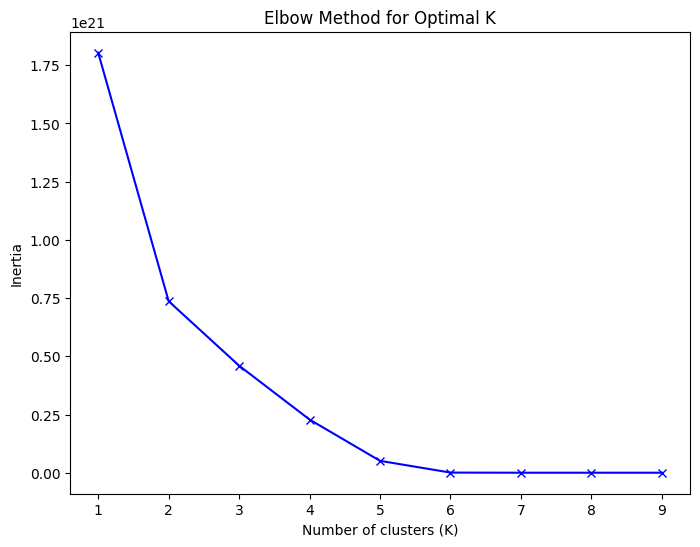

In [ ]:
elbow_method(scaled_features_pca)

In [ ]:
CHOSEN_K = 5

kmeans = KMeans(n_clusters=CHOSEN_K, random_state=42)

kmeans_labels = kmeans.fit_predict(scaled_features_pca)

/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


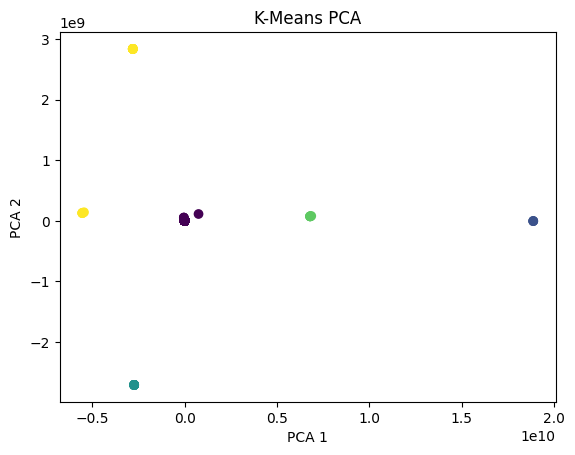

In [ ]:
plt.scatter(scaled_features_pca[:, 0], scaled_features_pca[:, 1], c=kmeans_labels, cmap='viridis')

plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('K-Means PCA')

plt.show()

## Conclusion



The elbow method analysis indicates that K=5 is an optimal number of clusters for segmenting the dataset, as the inertia decreases significantly up to this point before leveling off. This suggests that five clusters can effectively capture the underlying structure in the data without overfitting.



Upon applying K-means clustering to the PCA-transformed features, the scatter plot reveals distinct groupings along the two principal components. The first two principal components account for a cumulative explained variance of approximately 99.5%, capturing nearly all the variability in the dataset. This indicates that the dimensionality reduction was successful, simplifying the visualization while retaining most of the information.



However, a key limitation in our analysis is that the features in the item_features dataset are not clearly defined. Due to this lack of definition, it is challenging to interpret the clusters in a meaningful way or derive actionable business insights. Without a clear understanding of what each feature represents, it is not possible to link the clusters to specific customer behaviors or product attributes. As a result, while the clustering algorithm successfully identifies patterns in the data, these patterns cannot be translated into concrete business strategies or targeted actions.



To enhance the value of this analysis, it would be crucial to obtain a clear definition of the features in the item dataset. This would allow for more meaningful interpretation of the clusters and the development of actionable insights, such as customer segmentation or personalized marketing strategies.
